In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import networkx as nx

In [2]:
df_ratings = pd.read_csv('C:/Users/maria/Desktop/project_dv/title.ratings.tsv', sep='\t')
df_name_basics = pd.read_csv('C:/Users/maria/Desktop/project_dv/name.basics.tsv', sep="\t",low_memory=False, na_values=["\\N","nan", "NaN"])
df_akas = pd.read_csv('C:/Users/maria/Desktop/project_dv/title.akas.tsv', sep="\t",low_memory=False, na_values=["\\N","nan", "NaN"])
df_basics = pd.read_csv('C:/Users/maria/Desktop/project_dv/title.basics.tsv', sep="\t",low_memory=False, na_values=["\\N","nan","NaN"])
df_crew = pd.read_csv('C:/Users/maria/Desktop/project_dv/title.crew.tsv', sep='\t')
df_principals = pd.read_csv('C:/Users/maria/Desktop/project_dv/title.principals.tsv', sep='\t')
df_episode = pd.read_csv('C:/Users/maria/Desktop/project_dv/title.episode.tsv', sep='\t')

In [3]:
#df_basics[(df_basics.titleType=="tvMiniSeries")   no fim, se quisermos, fazemos das mini series
series_basics = df_basics[df_basics.titleType=='tvSeries']
episode_basics = df_basics[df_basics.titleType=="tvEpisode"]

In [4]:
series_basics

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
25060,tt0025509,tvSeries,Les Misérables,Les misérables,0.0,1934.0,1934.0,279,Drama
34965,tt0035599,tvSeries,Voice of Firestone Televues,Voice of Firestone Televues,0.0,1943.0,1947.0,15,NaN
35166,tt0035803,tvSeries,The German Weekly Review,Die Deutsche Wochenschau,0.0,1940.0,1945.0,12,"Documentary,News"
37595,tt0038276,tvSeries,You Are an Artist,You Are an Artist,0.0,1946.0,1955.0,15,Talk-Show
38429,tt0039120,tvSeries,Americana,Americana,0.0,1947.0,1949.0,30,"Family,Game-Show"
...,...,...,...,...,...,...,...,...,...
9267587,tt9916210,tvSeries,Rumpole of the Bailey,Rumpole of the Bailey,0.0,NaN,NaN,NaN,NaN
9267590,tt9916216,tvSeries,Kalyanam Mudhal Kadhal Varai,Kalyanam Mudhal Kadhal Varai,0.0,2014.0,2017.0,22,Romance
9267591,tt9916218,tvSeries,Lost in Food,Lost in Food,0.0,2016.0,2017.0,NaN,Talk-Show
9267671,tt9916380,tvSeries,Meie aasta Aafrikas,Meie aasta Aafrikas,0.0,2019.0,NaN,43,"Adventure,Comedy,Family"


In [5]:
episode_basics

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
20346,tt0020666,tvEpisode,Barnacle Bill,Barnacle Bill,0.0,1930.0,NaN,8,"Animation,Comedy,Family"
20507,tt0020829,tvEpisode,Dizzy Dishes,Dizzy Dishes,0.0,1930.0,NaN,6,"Animation,Comedy,Family"
20832,tt0021166,tvEpisode,Mysterious Mose,Mysterious Mose,0.0,1930.0,NaN,6,"Animation,Comedy,Family"
21262,tt0021612,tvEpisode,Any Little Girl That's a Nice Little Girl,Any Little Girl That's a Nice Little Girl,0.0,1931.0,NaN,7,"Animation,Comedy,Family"
21305,tt0021655,tvEpisode,Betty Co-ed,Betty Co-ed,0.0,1931.0,NaN,6,"Animation,Comedy,Family"
...,...,...,...,...,...,...,...,...,...
9267891,tt9916846,tvEpisode,Episode #3.18,Episode #3.18,0.0,2010.0,NaN,NaN,"Action,Drama,Family"
9267892,tt9916848,tvEpisode,Episode #3.17,Episode #3.17,0.0,2010.0,NaN,NaN,"Action,Drama,Family"
9267893,tt9916850,tvEpisode,Episode #3.19,Episode #3.19,0.0,2010.0,NaN,NaN,"Action,Drama,Family"
9267894,tt9916852,tvEpisode,Episode #3.20,Episode #3.20,0.0,2010.0,NaN,NaN,"Action,Drama,Family"


In [6]:
series_ratings = pd.merge(series_basics, df_ratings, on="tconst")

In [7]:
#aqui temos 83697 series
series_ratings

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes
0,tt0025509,tvSeries,Les Misérables,Les misérables,0.0,1934.0,1934.0,279,Drama,8.3,1800
1,tt0035803,tvSeries,The German Weekly Review,Die Deutsche Wochenschau,0.0,1940.0,1945.0,12,"Documentary,News",8.0,53
2,tt0039120,tvSeries,Americana,Americana,0.0,1947.0,1949.0,30,"Family,Game-Show",3.3,14
3,tt0039123,tvSeries,Kraft Theatre,Kraft Television Theatre,0.0,1947.0,1958.0,60,Drama,8.2,194
4,tt0039125,tvSeries,Public Prosecutor,Public Prosecutor,0.0,1947.0,1951.0,20,"Crime,Drama,Mystery",5.6,20
...,...,...,...,...,...,...,...,...,...,...,...
83692,tt9915822,tvSeries,Ichhapyaari Naagin,Ichhapyaari Naagin,0.0,2016.0,2017.0,20,Fantasy,8.3,55
83693,tt9916128,tvSeries,Salt City (India),Salt City (India),0.0,2022.0,NaN,NaN,Drama,6.7,63
83694,tt9916206,tvSeries,Nojor,Nojor,0.0,2019.0,NaN,20,Fantasy,2.6,29
83695,tt9916216,tvSeries,Kalyanam Mudhal Kadhal Varai,Kalyanam Mudhal Kadhal Varai,0.0,2014.0,2017.0,22,Romance,9.0,7


In [8]:
series_ratings.isna().sum()

tconst                0
titleType             0
primaryTitle          0
originalTitle         0
isAdult               0
startYear            31
endYear           50008
runtimeMinutes    37437
genres             3189
averageRating         0
numVotes              0
dtype: int64

In [9]:
len(series_ratings[series_ratings.startYear>2022])

0

In [10]:
# como startYear só tem 31 nas, vamos eliminá-los
series_ratings = series_ratings[(series_ratings.startYear.notnull())]

In [11]:
series_ratings

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes
0,tt0025509,tvSeries,Les Misérables,Les misérables,0.0,1934.0,1934.0,279,Drama,8.3,1800
1,tt0035803,tvSeries,The German Weekly Review,Die Deutsche Wochenschau,0.0,1940.0,1945.0,12,"Documentary,News",8.0,53
2,tt0039120,tvSeries,Americana,Americana,0.0,1947.0,1949.0,30,"Family,Game-Show",3.3,14
3,tt0039123,tvSeries,Kraft Theatre,Kraft Television Theatre,0.0,1947.0,1958.0,60,Drama,8.2,194
4,tt0039125,tvSeries,Public Prosecutor,Public Prosecutor,0.0,1947.0,1951.0,20,"Crime,Drama,Mystery",5.6,20
...,...,...,...,...,...,...,...,...,...,...,...
83692,tt9915822,tvSeries,Ichhapyaari Naagin,Ichhapyaari Naagin,0.0,2016.0,2017.0,20,Fantasy,8.3,55
83693,tt9916128,tvSeries,Salt City (India),Salt City (India),0.0,2022.0,NaN,NaN,Drama,6.7,63
83694,tt9916206,tvSeries,Nojor,Nojor,0.0,2019.0,NaN,20,Fantasy,2.6,29
83695,tt9916216,tvSeries,Kalyanam Mudhal Kadhal Varai,Kalyanam Mudhal Kadhal Varai,0.0,2014.0,2017.0,22,Romance,9.0,7


In [12]:
series_ratings.isna().sum()

tconst                0
titleType             0
primaryTitle          0
originalTitle         0
isAdult               0
startYear             0
endYear           49977
runtimeMinutes    37414
genres             3188
averageRating         0
numVotes              0
dtype: int64

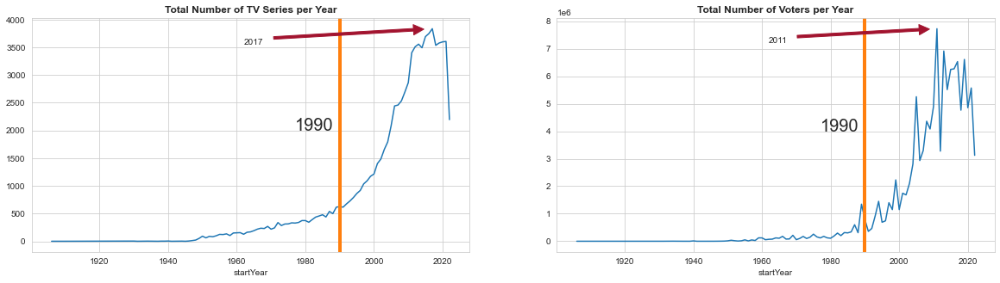

In [13]:
series_ratings = series_ratings[(series_ratings.startYear.notnull())&(series_ratings.startYear<2023)]
counts_yearly = series_ratings.groupby("startYear").agg({"averageRating":[np.mean], "numVotes":[np.sum,np.size,lambda x: np.sum(x)/np.size(x)]})

sns.set_style("whitegrid")

max_count_year = counts_yearly[("numVotes","sum")].idxmax().astype(int)
max_year = counts_yearly[("numVotes","size")].idxmax().astype(int)
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
ax =counts_yearly[("numVotes","size")].plot()
ax.annotate(max_year,xy=(max_year,counts_yearly[("numVotes","size")].max()),xytext=(1962,3550),
            arrowprops=dict(color="#A2142F",shrink=0.05,width=3))
plt.gca().axvline(x=1990, color =sns.color_palette()[1], lw=4)
plt.text(1977, 2000,"1990", fontsize=20)
plt.title("Total Number of TV Series per Year",fontweight="bold")
plt.subplot(1,2,2)
ax =counts_yearly[("numVotes","sum")].plot()
ax.annotate(max_count_year,xy=(max_count_year,counts_yearly[("numVotes","sum")].max()),
            xytext=(1962,7200000),arrowprops=dict(color="#A2142F", shrink= 0.05, width=3))
plt.gca().axvline(x=1990, color =sns.color_palette()[1], lw=4)
plt.text(1977, 4e6,"1990", fontsize=20)
plt.title("Total Number of Voters per Year",fontweight="bold")
plt.show()

In [14]:
# Gráfico de cima dá pra justificar que queremos as séries a partir de 1990
#nº de séries feitas por ano e nº de votos começam a subir muito a partir de 1990. temos das melhores séries de todos os tempos na década de 1990

In [15]:
counts_yearly = series_ratings.groupby("startYear").agg({"averageRating":[np.mean], "numVotes":[np.sum,np.size,lambda x: np.sum(x)/np.size(x)]})

sns.set_style("whitegrid")

max_count_year = counts_yearly[("numVotes","sum")].idxmax().astype(int)
max_year = counts_yearly[("numVotes","size")].idxmax().astype(int)

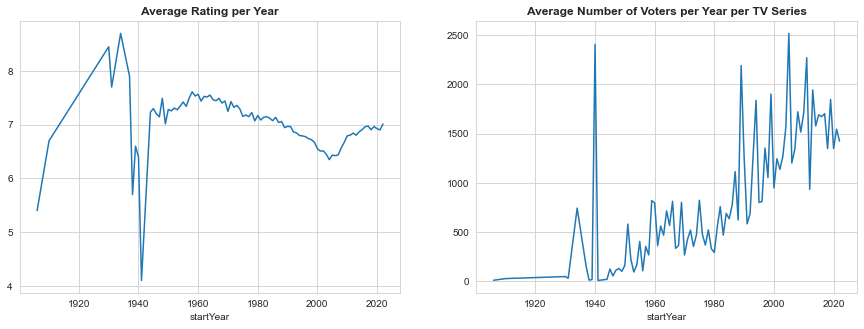

In [16]:
max_count_year_per_series = counts_yearly[("numVotes","<lambda_0>")].idxmax().astype(int)
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
ax =counts_yearly[("averageRating","mean")].plot()
plt.title("Average Rating per Year",fontweight="bold")
plt.subplot(1,2,2)
ax = counts_yearly[("numVotes","<lambda_0>")].plot()
plt.title("Average Number of Voters per Year per TV Series",fontweight="bold")
plt.show()

In [17]:
# Gráfico de cima dá pra justificar que popularidade não depende muito do rating, mas sim do numVotes

In [18]:
series_ratings = series_ratings[series_ratings.startYear>=1990]

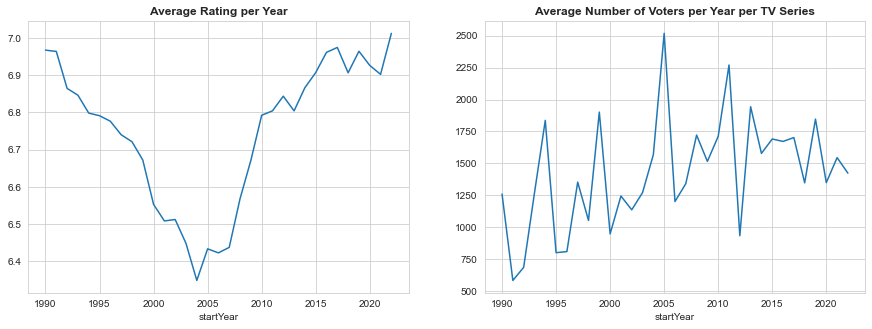

In [19]:
counts_yearly = series_ratings.groupby("startYear").agg({"averageRating":[np.mean], "numVotes":[np.sum,np.size,lambda x: np.sum(x)/np.size(x)]})

sns.set_style("whitegrid")

max_count_year = counts_yearly[("numVotes","sum")].idxmax().astype(int)
max_year = counts_yearly[("numVotes","size")].idxmax().astype(int)

max_count_year_per_series = counts_yearly[("numVotes","<lambda_0>")].idxmax().astype(int)
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
ax =counts_yearly[("averageRating","mean")].plot()
plt.title("Average Rating per Year",fontweight="bold")
plt.subplot(1,2,2)
ax = counts_yearly[("numVotes","<lambda_0>")].plot()
plt.title("Average Number of Voters per Year per TV Series",fontweight="bold")
plt.show()

In [20]:
series_ratings

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes
2202,tt0080217,tvSeries,Hana no mahoutsukai Mary Bell,Hana no mahoutsukai Mary Bell,0.0,1992.0,NaN,24,"Adventure,Animation,Comedy",7.1,29
2721,tt0087305,tvSeries,The Power of Desire,Força de Um Desejo,0.0,1999.0,2000.0,45,"Drama,Romance",7.7,153
2728,tt0088472,tvSeries,An Actor's Life for Me,An Actor's Life for Me,0.0,1991.0,1991.0,30,Comedy,7.3,35
2729,tt0088473,tvSeries,Adventures in Wonderland,Adventures in Wonderland,0.0,1992.0,1994.0,30,"Adventure,Comedy,Family",7.9,740
2996,tt0092330,tvSeries,Casino Royal,Casino Royal,0.0,1990.0,1990.0,NaN,Comedy,7.5,102
...,...,...,...,...,...,...,...,...,...,...,...
83692,tt9915822,tvSeries,Ichhapyaari Naagin,Ichhapyaari Naagin,0.0,2016.0,2017.0,20,Fantasy,8.3,55
83693,tt9916128,tvSeries,Salt City (India),Salt City (India),0.0,2022.0,NaN,NaN,Drama,6.7,63
83694,tt9916206,tvSeries,Nojor,Nojor,0.0,2019.0,NaN,20,Fantasy,2.6,29
83695,tt9916216,tvSeries,Kalyanam Mudhal Kadhal Varai,Kalyanam Mudhal Kadhal Varai,0.0,2014.0,2017.0,22,Romance,9.0,7


In [21]:
series_ratings.sort_values(by="numVotes", ascending=False).head(1005)

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes
25365,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874
24915,tt0903747,tvSeries,Breaking Bad,Breaking Bad,0.0,2008.0,2013.0,49,"Crime,Drama,Thriller",9.5,1837827
65709,tt4574334,tvSeries,Stranger Things,Stranger Things,0.0,2016.0,NaN,51,"Drama,Fantasy,Horror",8.7,1154541
4203,tt0108778,tvSeries,Friends,Friends,0.0,1994.0,2004.0,22,"Comedy,Romance",8.9,981157
43425,tt1520211,tvSeries,The Walking Dead,The Walking Dead,0.0,2010.0,2022.0,44,"Drama,Horror,Thriller",8.1,972109
...,...,...,...,...,...,...,...,...,...,...,...
57180,tt2674806,tvSeries,Inside No. 9,Inside No. 9,0.0,2014.0,NaN,30,"Comedy,Crime,Drama",8.5,16956
31811,tt11536424,tvSeries,Code M,Code M,0.0,2020.0,NaN,24,"Mystery,Thriller",7.6,16934
42873,tt15012366,tvSeries,The Empire,The Empire,0.0,2021.0,NaN,NaN,"Action,Drama,History",4.6,16932
69862,tt5638056,tvSeries,The Mick,The Mick,0.0,2017.0,2018.0,30,Comedy,7.8,16929


In [22]:
#Sucesso = mais de 20000 votos
series_ratings = series_ratings[series_ratings.numVotes>=20000]

In [23]:
#875 tvseries
series_ratings

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes
3344,tt0096657,tvSeries,Mr. Bean,Mr. Bean,0.0,1990.0,1995.0,25,"Comedy,Family",8.6,119254
3417,tt0098749,tvSeries,"Beverly Hills, 90210","Beverly Hills, 90210",0.0,1990.0,2000.0,44,"Drama,Romance",6.4,34586
3458,tt0098800,tvSeries,The Fresh Prince of Bel-Air,The Fresh Prince of Bel-Air,0.0,1990.0,1996.0,22,Comedy,7.9,134356
3485,tt0098844,tvSeries,Law & Order,Law & Order,0.0,1990.0,NaN,45,"Crime,Drama,Mystery",7.8,38661
3559,tt0098936,tvSeries,Twin Peaks,Twin Peaks,0.0,1990.0,1991.0,47,"Crime,Drama,Mystery",8.8,196505
...,...,...,...,...,...,...,...,...,...,...,...
83052,tt9612516,tvSeries,Space Force,Space Force,0.0,2020.0,2022.0,30,Comedy,6.7,64650
83117,tt9649436,tvSeries,Enaaya,Enaaya,0.0,2019.0,NaN,25,"Musical,Romance",7.4,20794
83139,tt9660182,tvSeries,Resident Evil,Resident Evil,0.0,2022.0,2022.0,60,"Action,Horror,Sci-Fi",4.0,39354
83180,tt9680440,tvSeries,Paatal Lok,Paatal Lok,0.0,2020.0,NaN,44,"Crime,Drama,Thriller",8.0,59877


In [24]:
print("Number of series from the 90's: ", len(series_ratings[(series_ratings.startYear>=1990) & (series_ratings.startYear<2000)]))
print("Number of series from the 00's: ", len(series_ratings[(series_ratings.startYear>=2000) & (series_ratings.startYear<2010)]))
print("Number of series from the 2010's: ", len(series_ratings[(series_ratings.startYear>=2010) & (series_ratings.startYear<2020)]))
print("Number of séries from the 2020's: ", len(series_ratings[series_ratings.startYear>=2020]))

Number of series from the 90's:  87
Number of series from the 00's:  210
Number of series from the 2010's:  456
Number of séries from the 2020's:  122


In [25]:
series_ratings.sort_values(by="numVotes", ascending=False)

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes
25365,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874
24915,tt0903747,tvSeries,Breaking Bad,Breaking Bad,0.0,2008.0,2013.0,49,"Crime,Drama,Thriller",9.5,1837827
65709,tt4574334,tvSeries,Stranger Things,Stranger Things,0.0,2016.0,NaN,51,"Drama,Fantasy,Horror",8.7,1154541
4203,tt0108778,tvSeries,Friends,Friends,0.0,1994.0,2004.0,22,"Comedy,Romance",8.9,981157
43425,tt1520211,tvSeries,The Walking Dead,The Walking Dead,0.0,2010.0,2022.0,44,"Drama,Horror,Thriller",8.1,972109
...,...,...,...,...,...,...,...,...,...,...,...
54701,tt2300923,tvSeries,Go On,Go On,0.0,2012.0,2013.0,22,Comedy,7.5,20122
12929,tt0300865,tvSeries,That's So Raven,That's So Raven,0.0,2003.0,2007.0,30,"Comedy,Family,Fantasy",6.6,20106
38474,tt1353056,tvSeries,RuPaul's Drag Race,RuPaul's Drag Race,0.0,2009.0,NaN,63,"Game-Show,Reality-TV",8.5,20106
3942,tt0105929,tvSeries,Absolutely Fabulous,Absolutely Fabulous,0.0,1992.0,2012.0,45,Comedy,8.2,20016


In [26]:
series_ratings.sort_values(by="averageRating", ascending=False)

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes
24915,tt0903747,tvSeries,Breaking Bad,Breaking Bad,0.0,2008.0,2013.0,49,"Crime,Drama,Thriller",9.5,1837827
82736,tt9471404,tvSeries,The Chosen,The Chosen,0.0,2017.0,NaN,54,"Drama,History",9.4,27176
77434,tt7657124,tvSeries,The Heroes,The Heroes,0.0,2008.0,NaN,30,"Animation,Drama,History",9.4,165766
34746,tt12392504,tvSeries,Scam 1992: The Harshad Mehta Story,Scam 1992: The Harshad Mehta Story,0.0,2020.0,2020.0,54,"Biography,Crime,Drama",9.3,142927
18428,tt0417299,tvSeries,Avatar: The Last Airbender,Avatar: The Last Airbender,0.0,2005.0,2008.0,23,"Action,Adventure,Animation",9.3,310023
...,...,...,...,...,...,...,...,...,...,...,...
41427,tt14482414,tvSeries,Racket Boys,Raketsonyeondan,0.0,2021.0,NaN,80,"Comedy,Drama,Sport",4.1,27626
83139,tt9660182,tvSeries,Resident Evil,Resident Evil,0.0,2022.0,2022.0,60,"Action,Horror,Sci-Fi",4.0,39354
44529,tt1563069,tvSeries,Jersey Shore,Jersey Shore,0.0,2009.0,2012.0,40,"Comedy,Drama,Reality-TV",3.8,23728
80647,tt8712204,tvSeries,Batwoman,Batwoman,0.0,2019.0,2022.0,45,"Action,Adventure,Crime",3.4,43941


In [27]:
votes=series_ratings.sort_values(by="numVotes", ascending=False)
fig = px.bar(votes, x=votes['primaryTitle'][:10], y=votes['numVotes'][:10],color=votes['primaryTitle'][:10],text_auto=True,labels={'x':'', 'y': 'Number of Votes','color': 'TV Series'},title="Top 10 Voted Series")
fig.update_traces(textfont_size=19, textangle=0)
fig.update_layout(title_x=0.5)

fig.show()
#fig.write_html("C:/Users/maria/Desktop/Plots/Top 10 Voted Series.html")

In [28]:
ratings=series_ratings.sort_values(by="averageRating", ascending=False)
fig = px.bar(ratings, x=ratings['primaryTitle'][:10], y=ratings['averageRating'][:10],color=ratings['primaryTitle'][:10],text_auto=True,labels={'x':'', 'y': 'Average Rating','color': 'TV Series'},title="Top 10 Rated Series", height=550)
fig.update_traces(textfont_size=10, textangle=0)
fig.update_layout(title_x=0.5)

fig.show()
#fig.write_html("C:/Users/maria/Desktop/Plots/Top 10 Rated Series.html")

In [29]:
series_ratings.genres.describe()

count                            875
unique                           150
top       Action,Adventure,Animation
freq                              70
Name: genres, dtype: object

In [30]:
# endYear provvelmente não vamos fazer nada; eliminar nans runtimeMinutes
series_ratings.isna().sum()

tconst              0
titleType           0
primaryTitle        0
originalTitle       0
isAdult             0
startYear           0
endYear           211
runtimeMinutes     17
genres              0
averageRating       0
numVotes            0
dtype: int64

In [31]:
series_ratings = series_ratings[series_ratings.runtimeMinutes.notnull()]

In [32]:
series_ratings.isna().sum()

tconst              0
titleType           0
primaryTitle        0
originalTitle       0
isAdult             0
startYear           0
endYear           198
runtimeMinutes      0
genres              0
averageRating       0
numVotes            0
dtype: int64

In [33]:
series_ratings

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes
3344,tt0096657,tvSeries,Mr. Bean,Mr. Bean,0.0,1990.0,1995.0,25,"Comedy,Family",8.6,119254
3417,tt0098749,tvSeries,"Beverly Hills, 90210","Beverly Hills, 90210",0.0,1990.0,2000.0,44,"Drama,Romance",6.4,34586
3458,tt0098800,tvSeries,The Fresh Prince of Bel-Air,The Fresh Prince of Bel-Air,0.0,1990.0,1996.0,22,Comedy,7.9,134356
3485,tt0098844,tvSeries,Law & Order,Law & Order,0.0,1990.0,NaN,45,"Crime,Drama,Mystery",7.8,38661
3559,tt0098936,tvSeries,Twin Peaks,Twin Peaks,0.0,1990.0,1991.0,47,"Crime,Drama,Mystery",8.8,196505
...,...,...,...,...,...,...,...,...,...,...,...
83052,tt9612516,tvSeries,Space Force,Space Force,0.0,2020.0,2022.0,30,Comedy,6.7,64650
83117,tt9649436,tvSeries,Enaaya,Enaaya,0.0,2019.0,NaN,25,"Musical,Romance",7.4,20794
83139,tt9660182,tvSeries,Resident Evil,Resident Evil,0.0,2022.0,2022.0,60,"Action,Horror,Sci-Fi",4.0,39354
83180,tt9680440,tvSeries,Paatal Lok,Paatal Lok,0.0,2020.0,NaN,44,"Crime,Drama,Thriller",8.0,59877


In [34]:
# Counting each unique genre using CountVectorizer

from sklearn.feature_extraction.text import CountVectorizer
temp = series_ratings.genres.dropna()
vec = CountVectorizer(token_pattern='(?u)\\b[\\w-]+\\b',analyzer='word').fit(temp)
bag_of_genres = vec.transform(temp)
unique_genres =  vec.get_feature_names()
np.array(unique_genres)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



array(['action', 'adventure', 'animation', 'biography', 'comedy', 'crime',
       'documentary', 'drama', 'family', 'fantasy', 'game-show',
       'history', 'horror', 'music', 'musical', 'mystery', 'news',
       'reality-tv', 'romance', 'sci-fi', 'short', 'sport', 'talk-show',
       'thriller', 'war', 'western'], dtype='<U11')

In [35]:
genres = pd.DataFrame(bag_of_genres.todense(),columns=unique_genres,index=temp.index)
sorted_genres_perc = pd.Series(genres.sum()).sort_values(ascending=False)

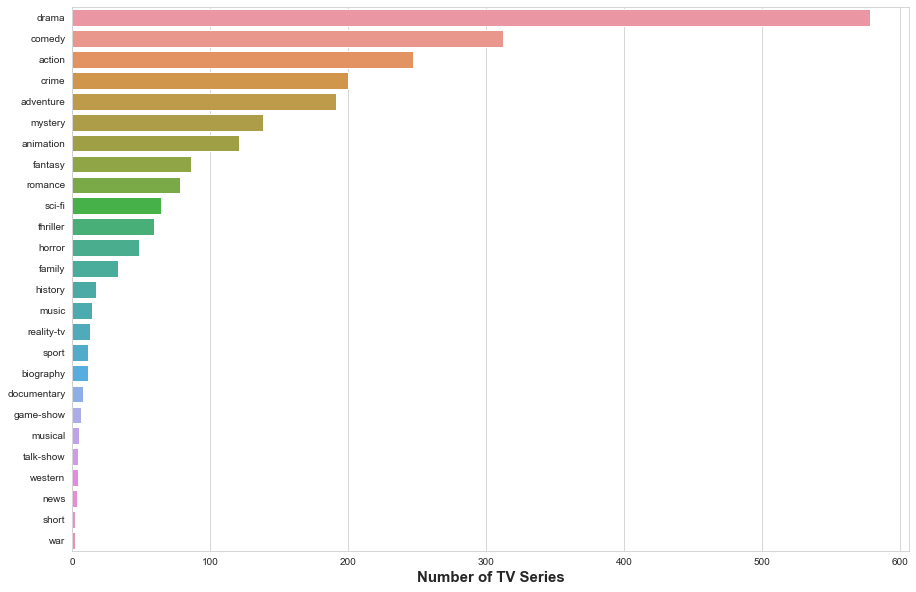

In [36]:
#drama e comedy no topo. VAMOS TRABALHAR SÓ COM AS DE DRAMA!!!!
sns.set_style("whitegrid")
plt.figure(figsize=(15,10))
sns.barplot(x=sorted_genres_perc.values,y=sorted_genres_perc.index)
plt.xlabel("Number of TV Series", fontsize=15, fontweight="bold")
plt.show()

In [37]:
fig = px.bar(sorted_genres_perc, x=sorted_genres_perc.values, y=sorted_genres_perc.index, color=sorted_genres_perc.index,text_auto=True,labels={'index':'Genres', 'x': 'Number of TV Series'},color_discrete_sequence=px.colors.qualitative.Light24)
fig.update_traces(textfont_size=19, textangle=0, textposition="outside")

fig.update_layout(title_text='Number of TV Series per Genre',title_x=0.5)

fig.show()
#fig.write_html("C:/Users/maria/Desktop/Plots/Number of TV Series per Genre.html")

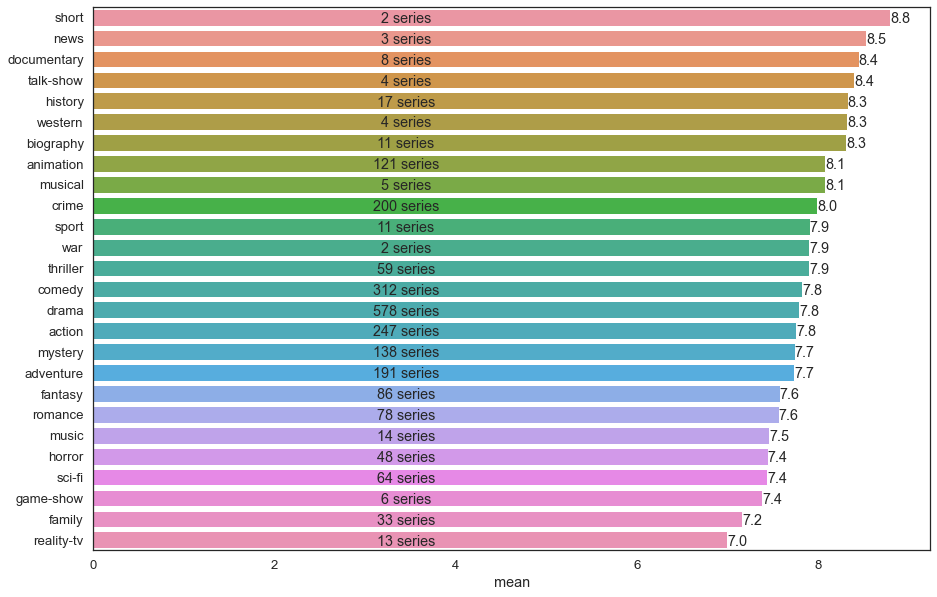

In [38]:
vec = CountVectorizer(token_pattern='(?u)\\b[\\w-]+\\b', analyzer='word').fit(series_ratings.genres)
bag_of_genres = pd.DataFrame(vec.transform(series_ratings.genres).todense(),
                             columns=vec.get_feature_names_out(),index=series_ratings.index)
series_ratings2 = pd.concat([series_ratings,bag_of_genres],axis=1)
rating_counts_means = pd.DataFrame([[series_ratings2.averageRating[series_ratings2[i]==1].mean(),series_ratings2[i].sum()] 
 for i in vec.get_feature_names_out()],columns=["mean","count"],index=vec.get_feature_names_out()).sort_values("mean",ascending=False)

sns.set(font_scale = 1.2)
sns.set_style("white")
plt.figure(figsize=(15,10))
sns.barplot(y=rating_counts_means.index,x=rating_counts_means["mean"])
for i,counts in enumerate(rating_counts_means["count"]):
    plt.text(3,i+0.25,f"{counts:>5} series")
    plt.text(rating_counts_means["mean"][i],i+0.25,round(rating_counts_means["mean"][i], 1))
plt.show()

In [39]:
vec = CountVectorizer(token_pattern='(?u)\\b[\\w-]+\\b', analyzer='word').fit(series_ratings.genres)
bag_of_genres = pd.DataFrame(vec.transform(series_ratings.genres).todense(),
                             columns=vec.get_feature_names_out(),index=series_ratings.index)
series_ratings2 = pd.concat([series_ratings,bag_of_genres],axis=1)
rating_counts_means = pd.DataFrame([[series_ratings2.averageRating[series_ratings2[i]==1].mean(),series_ratings2[i].sum()] 
 for i in vec.get_feature_names_out()],columns=["mean","count"],index=vec.get_feature_names_out()).sort_values("mean",ascending=False)

fig = px.bar(rating_counts_means, x=round(rating_counts_means["mean"],1), y=rating_counts_means.index, color=rating_counts_means.index,text_auto=True,labels={'index':'Genres','x':"Mean Average Rating"},color_discrete_sequence=px.colors.qualitative.Light24, width=1000)
fig.update_layout(title_text='TV Series Mean Average Rating per Genre',title_x=0.5)
fig.update_traces(textfont_size=20, textangle=0, textposition="outside")
fig.show()
#fig.write_html("C:/Users/maria/Desktop/Plots/TV Series Mean Average Rating per Genre.html")

In [44]:
# Mais uma vez, isto mostra que devemos dar prioridade ao numVotes em vez do averageRating visto que há mais séries de drama com mais de 20000 votos, no entanto, drama não é o genre com maior rating!

In [45]:
#VAMOS TRABALHAR SÓ COM DRAMA
series_ratings = series_ratings.loc[series_ratings['genres'].str.contains("Drama", case=False)]

In [46]:
#TEMOS 578 SERIES DE DRAMA
series_ratings

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes
3417,tt0098749,tvSeries,"Beverly Hills, 90210","Beverly Hills, 90210",0.0,1990.0,2000.0,44,"Drama,Romance",6.4,34586
3485,tt0098844,tvSeries,Law & Order,Law & Order,0.0,1990.0,NaN,45,"Crime,Drama,Mystery",7.8,38661
3559,tt0098936,tvSeries,Twin Peaks,Twin Peaks,0.0,1990.0,1991.0,47,"Crime,Drama,Mystery",8.8,196505
3956,tt0105946,tvSeries,Babylon 5,Babylon 5,0.0,1993.0,1998.0,45,"Action,Adventure,Drama",8.4,31676
3966,tt0105958,tvSeries,Boy Meets World,Boy Meets World,0.0,1993.0,2000.0,23,"Comedy,Drama,Family",8.1,43089
...,...,...,...,...,...,...,...,...,...,...,...
82688,tt9447956,tvSeries,The Fame Game,The Fame Game,0.0,2022.0,NaN,45,"Drama,Mystery,Thriller",6.7,21655
82736,tt9471404,tvSeries,The Chosen,The Chosen,0.0,2017.0,NaN,54,"Drama,History",9.4,27176
82899,tt9544034,tvSeries,The Family Man,The Family Man,0.0,2019.0,NaN,45,"Action,Comedy,Drama",8.7,86360
83180,tt9680440,tvSeries,Paatal Lok,Paatal Lok,0.0,2020.0,NaN,44,"Crime,Drama,Thriller",8.0,59877


In [47]:
#FAZER TOP 100 SERIES DE DRAMA 
series_ratings = series_ratings.sort_values(by="numVotes", ascending=False)[:100] 

In [48]:
series_ratings

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes
25365,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874
24915,tt0903747,tvSeries,Breaking Bad,Breaking Bad,0.0,2008.0,2013.0,49,"Crime,Drama,Thriller",9.5,1837827
65709,tt4574334,tvSeries,Stranger Things,Stranger Things,0.0,2016.0,NaN,51,"Drama,Fantasy,Horror",8.7,1154541
43425,tt1520211,tvSeries,The Walking Dead,The Walking Dead,0.0,2010.0,2022.0,44,"Drama,Horror,Thriller",8.1,972109
42232,tt1475582,tvSeries,Sherlock,Sherlock,0.0,2010.0,2017.0,88,"Crime,Drama,Mystery",9.1,915102
...,...,...,...,...,...,...,...,...,...,...,...
69005,tt5420376,tvSeries,Riverdale,Riverdale,0.0,2017.0,NaN,45,"Crime,Drama,Mystery",6.6,144168
34746,tt12392504,tvSeries,Scam 1992: The Harshad Mehta Story,Scam 1992: The Harshad Mehta Story,0.0,2020.0,2020.0,54,"Biography,Crime,Drama",9.3,142927
69515,tt5555260,tvSeries,This Is Us,This Is Us,0.0,2016.0,2022.0,45,"Comedy,Drama,Romance",8.7,142461
7988,tt0193676,tvSeries,Freaks and Geeks,Freaks and Geeks,0.0,1999.0,2000.0,44,"Comedy,Drama",8.8,142343


Text(0.5, 1.0, 'Distribution of top 100 Drama tv Series ratings')

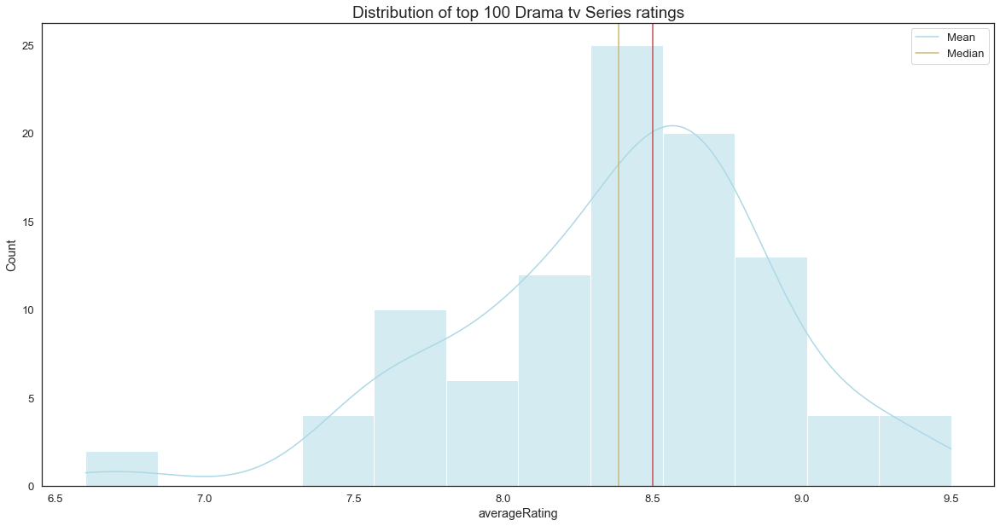

In [49]:
fig = plt.figure(figsize=(20,10))
ax = sns.histplot(series_ratings['averageRating'],color='lightblue', kde=True)
mean = series_ratings['averageRating'].mean()
median = series_ratings['averageRating'].median()
ax.axvline(mean, color='y', linestyle='-')
ax.axvline(median, color='r', linestyle='-')
plt.legend({'Mean': mean, 'Median': median})
plt.title('Distribution of top 100 Drama tv Series ratings', fontsize=19)

In [58]:
fig = px.histogram(series_ratings, x=series_ratings['averageRating'], color=series_ratings['averageRating'],
                   hover_data=series_ratings.columns,text_auto=True, color_discrete_sequence=px.colors.qualitative.Light24_r, labels={'averageRating':'Average Rating'})
fig.update_layout(title_text='Distribution of Top 100 Drama TV Series Ratings',title_x=0.5)
fig.show()
fig.write_html("C:/Users/maria/Desktop/Plots/Distribution of top 100 Drama tv Series ratings.html")

In [60]:
votes=series_ratings.sort_values(by="numVotes", ascending=False)
fig = px.bar(votes, x=votes['primaryTitle'][:10], y=votes['numVotes'][:10],color=votes['primaryTitle'][:10],text_auto=True,labels={'x':'', 'y': 'Number of Votes','color': 'TV Series'},title="Top 10 Voted Drama Series")
fig.update_traces(textfont_size=19, textangle=0)
fig.update_layout(title_x=0.5)

fig.show()
fig.write_html("C:/Users/maria/Desktop/Plots/Top 10 Voted Drama Series.html")

In [61]:
ratings=series_ratings.sort_values(by="averageRating", ascending=False)
fig = px.bar(ratings, x=ratings['primaryTitle'][:10], y=ratings['averageRating'][:10],color=ratings['primaryTitle'][:10],text_auto=True,labels={'x':'', 'y': 'Average Rating','color': 'TV Series'},title="Top 10 Rated Drama Series", height=550)
fig.update_traces(textfont_size=10, textangle=0)
fig.update_layout(title_x=0.5)

fig.show()

fig.write_html("C:/Users/maria/Desktop/Plots/Top 10 Rated Drama Series.html")

<AxesSubplot:xlabel='runtimeMinutes'>

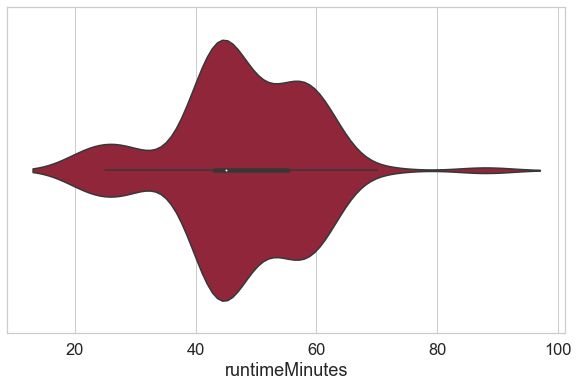

In [62]:
sns.set(font_scale = 1.5)
sns.set_style("whitegrid")
plt.figure(figsize=(10,6))
sns.violinplot(x=series_ratings.runtimeMinutes.dropna().astype(int), color="#A2142F")

In [63]:
#tvMiniSeries eles somam o runtime de todos os episódios
use = series_ratings[series_ratings.runtimeMinutes.notnull()]
use["runtimeMinutes"] = use.runtimeMinutes.astype(int)
use[use.runtimeMinutes>60]

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes
42232,tt1475582,tvSeries,Sherlock,Sherlock,0.0,2010.0,2017.0,88,"Crime,Drama,Mystery",9.1,915102
21144,tt0475784,tvSeries,Westworld,Westworld,0.0,2016.0,NaN,62,"Drama,Mystery,Sci-Fi",8.5,499399
73467,tt6468322,tvSeries,Money Heist,La casa de papel,0.0,2017.0,2021.0,70,"Action,Crime,Drama",8.2,470575


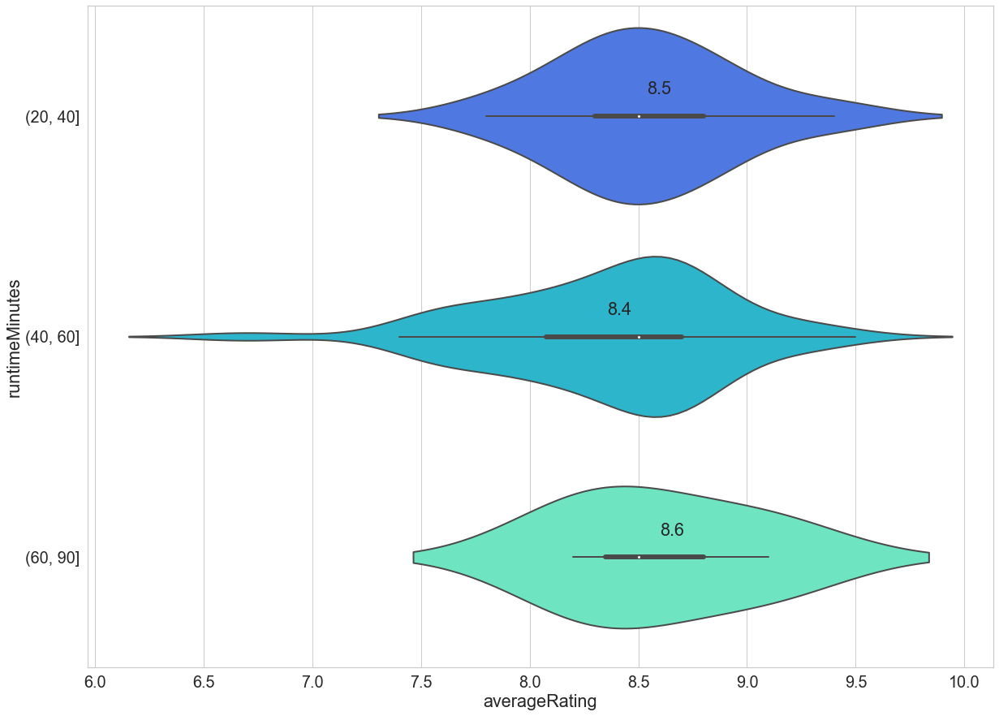

In [64]:
sns.set(font_scale = 1.8)
sns.set_style("whitegrid")
plt.figure(figsize=(20,15))
sns.set_palette("rainbow")

cut_bins = [20, 40, 60,90]


use =series_ratings
use["runtimeMinutes"] = pd.to_numeric(use.runtimeMinutes)
[groups,edges] = pd.cut(use.runtimeMinutes,bins=cut_bins,retbins=True, duplicates='drop')
ratings_avg = use.groupby(groups).agg({"averageRating":np.mean})
sns.violinplot(y=groups,x="averageRating",data=use, linewidth = 2)
for i,rate in enumerate(ratings_avg["averageRating"]):
    plt.text(rate,i-0.1,round(rate,1))
plt.show()

In [66]:
#FAZER COM NUMBER OF VOTES!!!!!!!!!!!!!!!!


use =series_ratings
use["runtimeMinutes"] = pd.to_numeric(use.runtimeMinutes)
use['Episodes Time In Minutes'] = use['runtimeMinutes'].apply((lambda x: 'Between 20 and 40' if (x >=20 and x <40) else 'Between 40 and 60' if (x >=40 and x<60) else 'Between 60 and 90'))

fig = px.violin(use,y="averageRating", x="Episodes Time In Minutes", color="Episodes Time In Minutes", box=True, points="all",
          hover_data=use.columns, labels={'averageRating': 'Average Rating'},category_orders={"Episodes Time In Minutes": ["Between 20 and 40", "Between 40 and 60", "Between 60 and 90"]})
fig.update_layout(title_text='Average Rating of the Top 100 Drama Series with different Episode Runtime',title_x=0.5)
fig.show()

fig.write_html("C:/Users/maria/Desktop/Plots/Episode Time in Minutes.html")

In [68]:
use =series_ratings
use["runtimeMinutes"] = pd.to_numeric(use.runtimeMinutes)
use['Episodes Time In Minutes'] = use['runtimeMinutes'].apply((lambda x: 'Between 20 and 40' if (x >=20 and x <40) else 'Between 40 and 60' if (x >=40 and x<60) else 'Between 60 and 90'))

fig = px.violin(use,y="numVotes", x="Episodes Time In Minutes", color="Episodes Time In Minutes", box=True, points="all",
          hover_data=use.columns, labels={'numVotes': 'Number of Votes'},category_orders={"Episodes Time In Minutes": ["Between 20 and 40", "Between 40 and 60", "Between 60 and 90"]})
fig.update_layout(title_text='Number of Votes of the Top 100 Drama Series with different Episode Runtime',title_x=0.5)
fig.show()

fig.write_html("C:/Users/maria/Desktop/Plots/Episode Time in Minutes (number of Votes).html")

In [70]:
series_ratings

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes,Episodes Time In Minutes
25365,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60
24915,tt0903747,tvSeries,Breaking Bad,Breaking Bad,0.0,2008.0,2013.0,49,"Crime,Drama,Thriller",9.5,1837827,Between 40 and 60
65709,tt4574334,tvSeries,Stranger Things,Stranger Things,0.0,2016.0,NaN,51,"Drama,Fantasy,Horror",8.7,1154541,Between 40 and 60
43425,tt1520211,tvSeries,The Walking Dead,The Walking Dead,0.0,2010.0,2022.0,44,"Drama,Horror,Thriller",8.1,972109,Between 40 and 60
42232,tt1475582,tvSeries,Sherlock,Sherlock,0.0,2010.0,2017.0,88,"Crime,Drama,Mystery",9.1,915102,Between 60 and 90
...,...,...,...,...,...,...,...,...,...,...,...,...
69005,tt5420376,tvSeries,Riverdale,Riverdale,0.0,2017.0,NaN,45,"Crime,Drama,Mystery",6.6,144168,Between 40 and 60
34746,tt12392504,tvSeries,Scam 1992: The Harshad Mehta Story,Scam 1992: The Harshad Mehta Story,0.0,2020.0,2020.0,54,"Biography,Crime,Drama",9.3,142927,Between 40 and 60
69515,tt5555260,tvSeries,This Is Us,This Is Us,0.0,2016.0,2022.0,45,"Comedy,Drama,Romance",8.7,142461,Between 40 and 60
7988,tt0193676,tvSeries,Freaks and Geeks,Freaks and Geeks,0.0,1999.0,2000.0,44,"Comedy,Drama",8.8,142343,Between 40 and 60


In [71]:
df_akas.columns = ['tconst', 'ordering', 'title', 'region', 'language', 'types',
       'attributes', 'isOriginalTitle']

In [72]:
df_akas

,tconst,ordering,title,region,language,types,attributes,isOriginalTitle
0,tt0000001,1,Карменсіта,UA,NaN,imdbDisplay,NaN,0.0
1,tt0000001,2,Carmencita,DE,NaN,NaN,literal title,0.0
2,tt0000001,3,Carmencita - spanyol tánc,HU,NaN,imdbDisplay,NaN,0.0
3,tt0000001,4,Καρμενσίτα,GR,NaN,imdbDisplay,NaN,0.0
4,tt0000001,5,Карменсита,RU,NaN,imdbDisplay,NaN,0.0
...,...,...,...,...,...,...,...,...
33362196,tt9916852,5,Episódio #3.20,PT,pt,NaN,NaN,0.0
33362197,tt9916852,6,Episodio #3.20,IT,it,NaN,NaN,0.0
33362198,tt9916852,7,एपिसोड #3.20,IN,hi,NaN,NaN,0.0
33362199,tt9916856,1,The Wind,DE,NaN,imdbDisplay,NaN,0.0


In [73]:
series_ratings

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes,Episodes Time In Minutes
25365,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60
24915,tt0903747,tvSeries,Breaking Bad,Breaking Bad,0.0,2008.0,2013.0,49,"Crime,Drama,Thriller",9.5,1837827,Between 40 and 60
65709,tt4574334,tvSeries,Stranger Things,Stranger Things,0.0,2016.0,NaN,51,"Drama,Fantasy,Horror",8.7,1154541,Between 40 and 60
43425,tt1520211,tvSeries,The Walking Dead,The Walking Dead,0.0,2010.0,2022.0,44,"Drama,Horror,Thriller",8.1,972109,Between 40 and 60
42232,tt1475582,tvSeries,Sherlock,Sherlock,0.0,2010.0,2017.0,88,"Crime,Drama,Mystery",9.1,915102,Between 60 and 90
...,...,...,...,...,...,...,...,...,...,...,...,...
69005,tt5420376,tvSeries,Riverdale,Riverdale,0.0,2017.0,NaN,45,"Crime,Drama,Mystery",6.6,144168,Between 40 and 60
34746,tt12392504,tvSeries,Scam 1992: The Harshad Mehta Story,Scam 1992: The Harshad Mehta Story,0.0,2020.0,2020.0,54,"Biography,Crime,Drama",9.3,142927,Between 40 and 60
69515,tt5555260,tvSeries,This Is Us,This Is Us,0.0,2016.0,2022.0,45,"Comedy,Drama,Romance",8.7,142461,Between 40 and 60
7988,tt0193676,tvSeries,Freaks and Geeks,Freaks and Geeks,0.0,1999.0,2000.0,44,"Comedy,Drama",8.8,142343,Between 40 and 60


In [74]:
akas_ratings = pd.merge(series_ratings,df_akas, on="tconst")

In [75]:
#Para 100 drama tvseries, em quantas regions é que essa serie é transmitida
akas_ratings

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes,Episodes Time In Minutes,ordering,title,region,language,types,attributes,isOriginalTitle
0,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,10,Game of Thrones,IN,hi,imdbDisplay,NaN,0.0
1,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,11,Taxt o'yinlari,UZ,NaN,alternative,NaN,0.0
2,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,12,Game of Thrones - Le trône de fer,FR,NaN,NaN,DVD box title,0.0
3,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,13,Game of Thrones,AU,NaN,imdbDisplay,NaN,0.0
4,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,14,Taht Oyunları,TR,tr,imdbDisplay,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4544,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,5,Правонаступництво,UA,NaN,imdbDisplay,NaN,0.0
4545,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,6,繼承之戰,TW,NaN,imdbDisplay,NaN,0.0
4546,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,7,Kế Nghiệp,VN,NaN,imdbDisplay,NaN,0.0
4547,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,8,Succession,CA,fr,imdbDisplay,NaN,0.0


In [76]:
akas_ratings.isna().sum()

tconst                         0
titleType                      0
primaryTitle                   0
originalTitle                  0
isAdult                        0
startYear                      0
endYear                     1004
runtimeMinutes                 0
genres                         0
averageRating                  0
numVotes                       0
Episodes Time In Minutes       0
ordering                       0
title                          0
region                       113
language                    3033
types                        438
attributes                  4342
isOriginalTitle                0
dtype: int64

In [78]:
akas_ratings.language.value_counts(dropna=False)


NaN    3033
en      943
fr      107
ja      103
hi      102
tr      101
bg       89
cmn      20
fa       10
he        9
yue       8
sr        5
sv        4
bs        3
pt        2
ar        2
cs        1
es        1
ca        1
ur        1
de        1
ml        1
bn        1
hr        1
Name: language, dtype: int64

In [ ]:
pip install pycountry

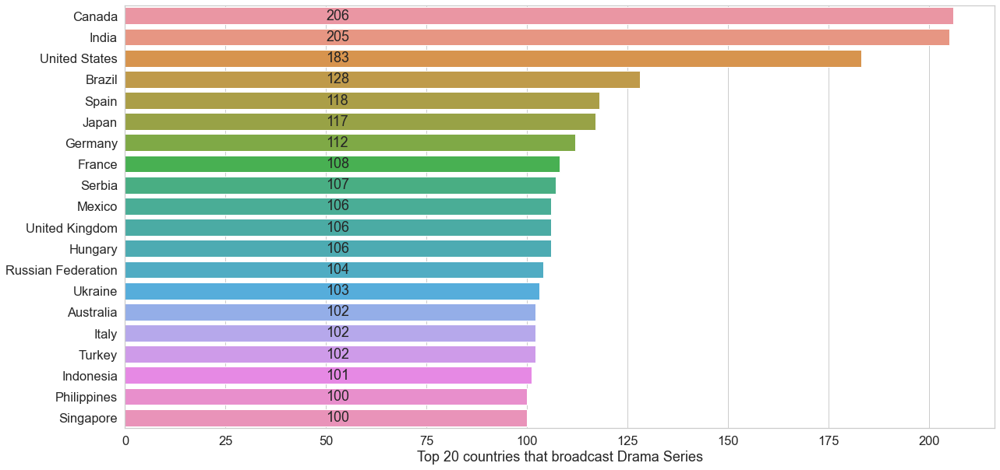

In [79]:
#Para 100 drama tvseries, em quantas regions é que essa serie é transmitida
import pycountry
country_counts = akas_ratings.region.value_counts()
country_names = [pycountry.countries.get(alpha_2=coun).name for coun in country_counts.index[:20]]
counts = country_counts.values[:20]

sns.set(font_scale = 1.5)
sns.set_style("whitegrid")
sns.set_palette("Set2")
plt.figure(figsize=(20,10))
sns.barplot(x=counts,y=country_names,orient="h")
plt.xlabel("Top 20 countries that broadcast Drama Series")
for i,count in enumerate(counts):
    plt.text(50,i,count,va="center")

In [80]:
data = dict(
    number=[206, 205, 183, 128,118,117,112,108,107,106],
    country=["Canada", "India", "United States", "Brazil", "Spain","Japan","Germany","France","Serbia","Mexico"])
fig = px.funnel(data, x='number', y='country',color="country",title="Top 10 Countries that Broadcast the Top 100 Drama Series", category_orders={"country":["Mexico", "Serbia","France","Germany","Japan","Spain","Brazil","United States", "India", "Canada"]})
fig.update_layout(title_x=0.5)
fig.show()
fig.write_html("C:/Users/maria/Desktop/Plots/Top 10 Countries that Broadcast Drama Series.html")

In [81]:
language_counts = akas_ratings.language.value_counts()[:10]

<AxesSubplot:>

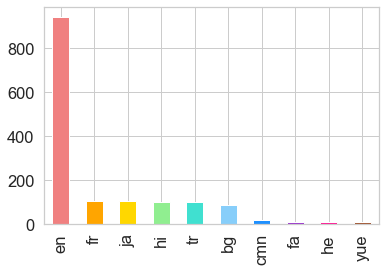

In [82]:
c = ['lightcoral', 'orange', 'gold', 'lightgreen', 'turquoise','lightskyblue','dodgerblue','darkorchid','deeppink','sienna']
language_counts.plot.bar(color=c)

In [83]:
df_crew

,tconst,directors,writers
0,tt0000001,nm0005690,\N
1,tt0000002,nm0721526,\N
2,tt0000003,nm0721526,\N
3,tt0000004,nm0721526,\N
4,tt0000005,nm0005690,\N
...,...,...,...
9267892,tt9916848,"nm5519454,nm5519375","nm6182221,nm1628284,nm2921377"
9267893,tt9916850,"nm5519375,nm5519454","nm6182221,nm1628284,nm2921377"
9267894,tt9916852,"nm5519375,nm5519454","nm6182221,nm1628284,nm2921377"
9267895,tt9916856,nm10538645,nm6951431


In [84]:
df_crew.isna().sum() 

tconst       0
directors    0
writers      0
dtype: int64

In [85]:
crew_ratings = pd.merge(series_ratings, df_crew, on="tconst")

In [86]:
crew_ratings

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes,Episodes Time In Minutes,directors,writers
0,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,"nm0007008,nm0806252,nm1888967,nm0687964,nm0755...","nm1125275,nm0552333,nm1888967,nm4984276,nm2643..."
1,tt0903747,tvSeries,Breaking Bad,Breaking Bad,0.0,2008.0,2013.0,49,"Crime,Drama,Thriller",9.5,1837827,Between 40 and 60,"nm0400486,nm0533713,nm0002835,nm0319213,nm1028...","nm0319213,nm0332467,nm2297407,nm1028558,nm0909..."
2,tt4574334,tvSeries,Stranger Things,Stranger Things,0.0,2016.0,NaN,51,"Drama,Fantasy,Horror",8.7,1154541,Between 40 and 60,"nm0030735,nm0506613,nm0004056,nm0003802,nm3275...","nm1819972,nm1819973,nm2099451,nm4418668,nm6863..."
3,tt1520211,tvSeries,The Walking Dead,The Walking Dead,0.0,2010.0,2022.0,44,"Drama,Horror,Thriller",8.1,972109,Between 40 and 60,"nm0400486,nm0272704,nm0687964,nm0571739,nm0069...","nm1891501,nm0001104,nm3079117,nm3877885,nm1764..."
4,tt1475582,tvSeries,Sherlock,Sherlock,0.0,2010.0,2017.0,88,"Crime,Drama,Mystery",9.1,915102,Between 60 and 90,"nm0006476,nm0533559,nm0403541,nm0317328,nm0139...","nm0309693,nm0595590,nm0236279,nm1839162"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,tt5420376,tvSeries,Riverdale,Riverdale,0.0,2017.0,NaN,45,"Crime,Drama,Mystery",6.6,144168,Between 40 and 60,"nm0929360,nm0003080,nm0453003,nm0683478,nm0941...","nm2630745,nm4883879,nm9586973,nm4782509,nm6295..."
96,tt12392504,tvSeries,Scam 1992: The Harshad Mehta Story,Scam 1992: The Harshad Mehta Story,0.0,2020.0,2020.0,54,"Biography,Crime,Drama",9.3,142927,Between 40 and 60,"nm1312094,nm0576554","nm13229841,nm7502891,nm8209528,nm4106454,nm119..."
97,tt5555260,tvSeries,This Is Us,This Is Us,0.0,2016.0,2022.0,45,"Comedy,Drama,Romance",8.7,142461,Between 40 and 60,"nm1026856,nm1036574,nm0362566,nm2884388,nm0950...","nm1557594,nm7988902,nm4435408,nm8204795,nm6011..."
98,tt0193676,tvSeries,Freaks and Geeks,Freaks and Geeks,0.0,1999.0,2000.0,44,"Comedy,Drama",8.8,142343,Between 40 and 60,"nm0082450,nm0037708,nm0031976,nm0646440,nm0440...","nm0082450,nm0031976,nm0925234,nm0431817,nm0630..."


In [87]:
crew_ratings.isna().sum()

tconst                       0
titleType                    0
primaryTitle                 0
originalTitle                0
isAdult                      0
startYear                    0
endYear                     22
runtimeMinutes               0
genres                       0
averageRating                0
numVotes                     0
Episodes Time In Minutes     0
directors                    0
writers                      0
dtype: int64

Text(0, 0.5, '')

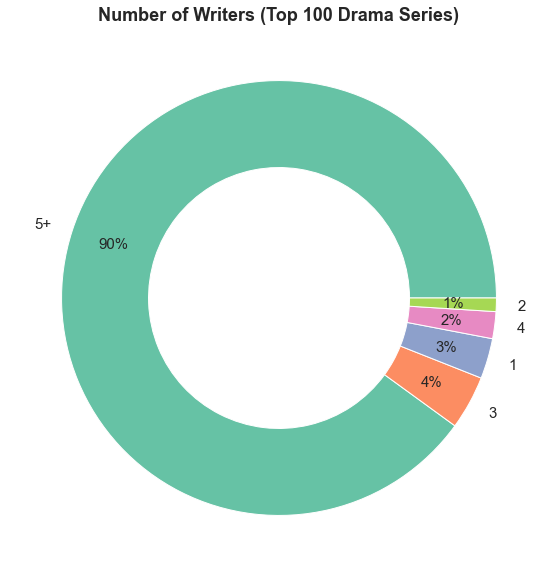

In [88]:
#Comes as no surprise since series have several episodes and, consequentely, several directors and writers
writer_counts = crew_ratings.writers.dropna().apply(lambda x: len(x.split(",")))
writer_counts[writer_counts>4] = "5+"
director_counts = crew_ratings.directors.dropna().apply(lambda x: len(x.split(",")))
director_counts[director_counts>2] = "3+"
plt.figure(figsize=(12,10))
writer_counts.value_counts().plot.pie(autopct="%.0f%%",pctdistance=0.8,
                                     wedgeprops=dict(width=0.4), textprops={'fontsize': 15})
plt.title("Number of Writers (Top 100 Drama Series)",fontweight="bold")
plt.ylabel(None)

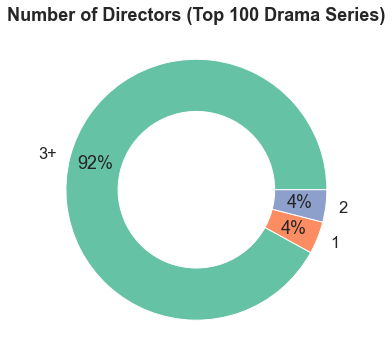

In [89]:
plt.figure(figsize=(12,6))
director_counts.value_counts().plot.pie(autopct="%.0f%%",pctdistance=0.8,
                                     wedgeprops=dict(width=0.4))
plt.title("Number of Directors (Top 100 Drama Series)",fontweight="bold")
plt.ylabel(None)
plt.show()

In [90]:
writer_counts.value_counts()

5+    90
3      4
1      3
4      2
2      1
Name: writers, dtype: int64

In [91]:
director_counts.value_counts()

3+    92
1      4
2      4
Name: directors, dtype: int64

In [92]:
writer_counts = crew_ratings.writers.dropna().apply(lambda x: len(x.split(",")))
temp = crew_ratings[["startYear","primaryTitle","writers"]].loc[writer_counts.nsmallest(15).index]
temp["Writer Count"] = writer_counts.nsmallest(15)
temp

,startYear,primaryTitle,writers,Writer Count
19,2021.0,Squid Game,nm1375363,1
80,2008.0,The Heroes,nm9434508,1
88,2016.0,Fleabag,nm3564817,1
11,2013.0,Vikings,"nm0386694,nm0689482",2
9,2013.0,Peaky Blinders,"nm1140275,nm3023628,nm2133107",3
38,2021.0,Aspirants,"nm5523511,nm2837311,nm8311749",3
61,2010.0,Downton Abbey,"nm0271501,nm1780018,nm0827322",3
65,2017.0,Big Little Lies,"nm0005082,nm3697342,nm9003355",3
4,2010.0,Sherlock,"nm0309693,nm0595590,nm0236279,nm1839162",4
72,2019.0,Euphoria,"nm2129572,nm0505579,nm0506094,nm9476408",4


In [93]:
temp = crew_ratings[["startYear","primaryTitle","writers"]].loc[writer_counts.nlargest(15).index]
temp["Writer Count"] = writer_counts.nlargest(15)
temp

,startYear,primaryTitle,writers,Writer Count
94,2003.0,NCIS,"nm0069074,nm1453745,nm0082811,nm1766652,nm1731...",63
36,2005.0,Grey's Anatomy,"nm0722274,nm1652155,nm9698564,nm2629239,nm2715...",60
57,1993.0,The X-Files,"nm0004810,nm0819487,nm0793062,nm0068272,nm0535...",55
84,2005.0,Bones,"nm0197855,nm0326246,nm4314641,nm3194933,nm5982...",55
18,2005.0,Supernatural,"nm0471392,nm1877263,nm2749064,nm1571148,nm0517...",53
28,2014.0,The Flash,"nm0075528,nm0424315,nm1132610,nm4214168,nm3354...",53
58,2005.0,Doctor Who,"nm0595590,nm0628285,nm1163823,nm0203961,nm0622...",49
66,2005.0,Criminal Minds,"nm1471491,nm2336731,nm2021590,nm3400157,nm1110...",48
47,2013.0,The Blacklist,"nm0092578,nm5982142,nm6388970,nm0718600,nm3747...",47
32,2009.0,The Vampire Diaries,"nm0687096,nm0932078,nm3468606,nm3373340,nm3691...",44


In [94]:
temp = crew_ratings[["startYear","primaryTitle","writers", "numVotes"]].loc[writer_counts.index]
temp["Writer Count"] = writer_counts
temp.sort_values(by="numVotes", ascending=False).head(10)

,startYear,primaryTitle,writers,numVotes,Writer Count
0,2011.0,Game of Thrones,"nm1125275,nm0552333,nm1888967,nm4984276,nm2643...",2060874,9
1,2008.0,Breaking Bad,"nm0319213,nm0332467,nm2297407,nm1028558,nm0909...",1837827,10
2,2016.0,Stranger Things,"nm1819972,nm1819973,nm2099451,nm4418668,nm6863...",1154541,11
3,2010.0,The Walking Dead,"nm1891501,nm0001104,nm3079117,nm3877885,nm1764...",972109,33
4,2010.0,Sherlock,"nm0309693,nm0595590,nm0236279,nm1839162",915102,4
5,2006.0,Dexter,"nm2416255,nm0543612,nm0348940,nm0118420,nm2385...",721404,21
6,2014.0,True Detective,"nm4446305,nm7450001,nm0330704,nm0586965,nm0411517",563677,5
7,2004.0,Lost,"nm0009190,nm0509340,nm0511541,nm2148402,nm0193...",549239,34
8,2011.0,Black Mirror,"nm0111765,nm2782297,nm1104036,nm0403294,nm0606...",537088,8
9,2013.0,Peaky Blinders,"nm1140275,nm3023628,nm2133107",533493,3


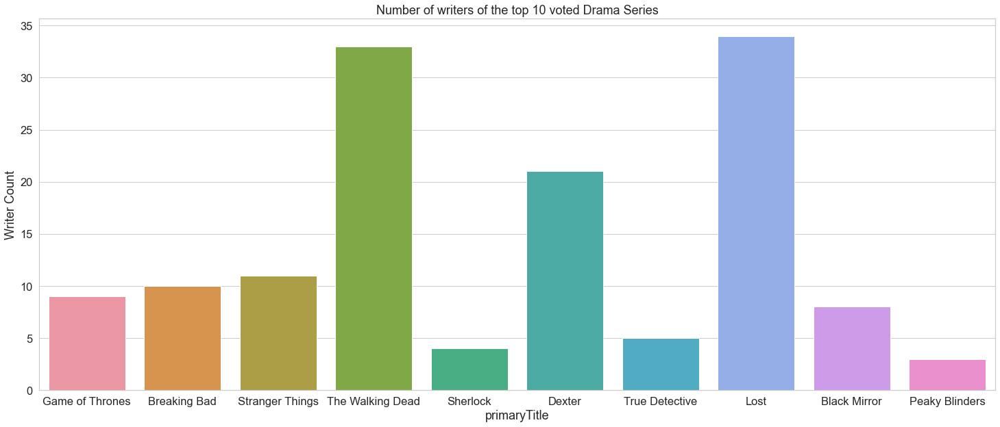

In [95]:
sns.set_palette("Set2")
sns.set_style("whitegrid")
fig,axs=plt.subplots(figsize=(25,10))
g=sns.barplot(x=temp['primaryTitle'][:10],y=temp['Writer Count'][:10])
g.set_title("Number of writers of the top 10 voted Drama Series")
plt.show()

In [96]:
fig = px.bar(temp,x=temp['primaryTitle'][:10],y=temp['Writer Count'][:10],color=temp['primaryTitle'][:10],text_auto=True,labels={'x':'', 'y': 'Writer Count','color': 'TV Series'},title="Number of Writers of the Top 10 Voted Drama Series")
fig.update_traces(textfont_size=15, textangle=0)
fig.update_layout(title_x=0.5)

fig.show()
fig.write_html("C:/Users/maria/Desktop/Plots/Number of Writers of the top 10 voted Drama Series.html")

In [98]:
temp = crew_ratings[["startYear","primaryTitle","writers", "numVotes", "averageRating"]].loc[writer_counts.index]
temp["Writer Count"] = writer_counts
temp.sort_values(by="averageRating", ascending=False).head(10)

,startYear,primaryTitle,writers,numVotes,averageRating,Writer Count
1,2008.0,Breaking Bad,"nm0319213,nm0332467,nm2297407,nm1028558,nm0909...",1837827,9.5,10
80,2008.0,The Heroes,nm9434508,165766,9.4,1
30,2002.0,The Wire,"nm0800108,nm0122654,nm0527160,nm0959567,nm1743...",336103,9.3,14
96,2020.0,Scam 1992: The Harshad Mehta Story,"nm13229841,nm7502891,nm8209528,nm4106454,nm119...",142927,9.3,6
0,2011.0,Game of Thrones,"nm1125275,nm0552333,nm1888967,nm4984276,nm2643...",2060874,9.2,9
38,2021.0,Aspirants,"nm5523511,nm2837311,nm8311749",296385,9.2,3
24,1999.0,The Sopranos,"nm0153740,nm1010540,nm0121331,nm1053841,nm1980...",391640,9.2,22
4,2010.0,Sherlock,"nm0309693,nm0595590,nm0236279,nm1839162",915102,9.1,4
43,2002.0,Firefly,"nm0923736,nm0128881,nm0596711,nm0591101,nm0249...",264361,9.0,8
33,2006.0,Death Note,"nm1981275,nm0409323,nm2423816,nm1639992,nm1761...",317258,9.0,7


In [100]:
fig = px.bar(temp,x=temp['primaryTitle'][:10],y=temp['Writer Count'][:10],color=temp['primaryTitle'][:10],text_auto=True,labels={'x':'', 'y': 'Writer Count','color': 'TV Series'},title="Number of Writers of the Top 10 Rated Drama Series")
fig.update_traces(textfont_size=15, textangle=0)
fig.update_layout(title_x=0.5)

fig.show()
fig.write_html("C:/Users/maria/Desktop/Plots/Number of Writers of the top 10 rated Drama Series.html")

In [101]:
director_counts = crew_ratings.directors.dropna().apply(lambda x: len(x.split(",")))
temp = crew_ratings[["startYear","primaryTitle","directors"]].loc[director_counts.nsmallest(15).index]
temp["Director Count"] = director_counts.nsmallest(15)
temp

,startYear,primaryTitle,directors,Director Count
19,2021.0,Squid Game,nm1375363,1
26,2017.0,Dark,nm2171633,1
38,2021.0,Aspirants,nm8600313,1
80,2008.0,The Heroes,nm9434508,1
65,2017.0,Big Little Lies,"nm0885249,nm0036349",2
76,1998.0,That '70s Show,"nm0870699,nm0400958",2
88,2016.0,Fleabag,"nm1469191,nm0102873",2
96,2020.0,Scam 1992: The Harshad Mehta Story,"nm1312094,nm0576554",2
72,2019.0,Euphoria,"nm0506094,nm4549849,nm1435438,nm0607185",4
42,2019.0,Sex Education,"nm3513341,nm5486712,nm4941469,nm4829613,nm1054899",5


In [102]:
temp = crew_ratings[["startYear","primaryTitle","directors"]].loc[director_counts.nlargest(15).index]
temp["Director Count"] = director_counts.nlargest(15)
temp

,startYear,primaryTitle,directors,Director Count
36,2005.0,Grey's Anatomy,"nm0180085,nm0571727,nm0000739,nm0933156,nm0844...",89
66,2005.0,Criminal Minds,"nm0509409,nm0001505,nm0283816,nm0272704,nm0735...",77
28,2014.0,The Flash,"nm0538387,nm0908630,nm0624423,nm0839660,nm0795...",61
18,2005.0,Supernatural,"nm0001645,nm0543129,nm0923571,nm0066596,nm0850...",59
58,2005.0,Doctor Who,"nm0363865,nm0528186,nm3833743,nm0533559,nm0003...",58
51,2011.0,Shameless,"nm0007096,nm1580370,nm0291082,nm0718001,nm1564...",55
84,2005.0,Bones,"nm0224145,nm0762541,nm0944981,nm0514546,nm0923...",54
47,2013.0,The Blacklist,"nm0473936,nm0534850,nm0686853,nm0011876,nm0311...",53
3,2010.0,The Walking Dead,"nm0400486,nm0272704,nm0687964,nm0571739,nm0069...",51
57,1993.0,The X-Files,"nm0362738,nm0604587,nm0641343,nm0000141,nm0923...",51


In [103]:
temp = crew_ratings[["startYear","primaryTitle","directors", "numVotes"]].loc[director_counts.index]
temp["Director Count"] = director_counts
temp.sort_values(by="numVotes", ascending=False).head(10)

,startYear,primaryTitle,directors,numVotes,Director Count
0,2011.0,Game of Thrones,"nm0007008,nm0806252,nm1888967,nm0687964,nm0755...",2060874,19
1,2008.0,Breaking Bad,"nm0400486,nm0533713,nm0002835,nm0319213,nm1028...",1837827,25
2,2016.0,Stranger Things,"nm0030735,nm0506613,nm0004056,nm0003802,nm3275...",1154541,7
3,2010.0,The Walking Dead,"nm0400486,nm0272704,nm0687964,nm0571739,nm0069...",972109,51
4,2010.0,Sherlock,"nm0006476,nm0533559,nm0403541,nm0317328,nm0139...",915102,10
5,2006.0,Dexter,"nm0191147,nm0203215,nm0864268,nm0777447,nm0542...",721404,22
6,2014.0,True Detective,"nm0755261,nm1259871,nm0003733,nm0687964,nm1560...",563677,11
7,2004.0,Lost,"nm0944981,nm0744794,nm0005522,nm0393661,nm0485...",549239,26
8,2011.0,Black Mirror,"nm1347708,nm3205815,nm1720541,nm0870469,nm0383...",537088,18
9,2013.0,Peaky Blinders,"nm1396104,nm1142073,nm2139803,nm0128452,nm1163...",533493,6


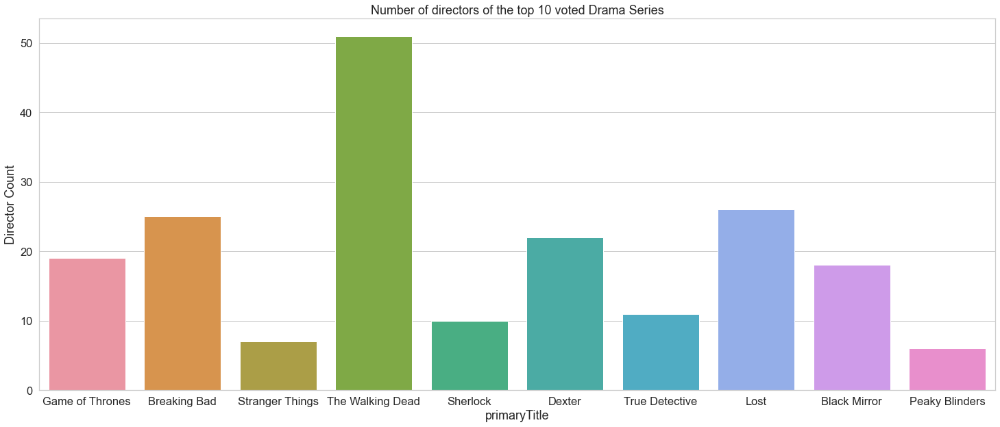

In [104]:
sns.set_palette("Set2")
sns.set_style("whitegrid")
fig,axs=plt.subplots(figsize=(25,10))
g=sns.barplot(x=temp['primaryTitle'][:10],y=temp['Director Count'][:10])
g.set_title("Number of directors of the top 10 voted Drama Series")
plt.show()

In [105]:
fig = px.bar(temp,x=temp['primaryTitle'][:10],y=temp['Director Count'][:10],color=temp['primaryTitle'][:10],text_auto=True,labels={'x':'', 'y': 'Director Count','color': 'TV Series'},title="Number of Directors of the Top 10 Voted Drama Series")
fig.update_traces(textfont_size=15, textangle=0)
fig.update_layout(title_x=0.5)

fig.show()
fig.write_html("C:/Users/maria/Desktop/Plots/Number of Directors of the top 10 voted Drama Series.html")

In [106]:
temp = crew_ratings[["startYear","primaryTitle","directors", "numVotes","averageRating"]].loc[director_counts.index]
temp["Director Count"] = director_counts
temp.sort_values(by="averageRating", ascending=False).head(10)

,startYear,primaryTitle,directors,numVotes,averageRating,Director Count
1,2008.0,Breaking Bad,"nm0400486,nm0533713,nm0002835,nm0319213,nm1028...",1837827,9.5,25
80,2008.0,The Heroes,nm9434508,165766,9.4,1
30,2002.0,The Wire,"nm0152640,nm0225416,nm0424800,nm0080601,nm0793...",336103,9.3,27
96,2020.0,Scam 1992: The Harshad Mehta Story,"nm1312094,nm0576554",142927,9.3,2
0,2011.0,Game of Thrones,"nm0007008,nm0806252,nm1888967,nm0687964,nm0755...",2060874,9.2,19
38,2021.0,Aspirants,nm8600313,296385,9.2,1
24,1999.0,The Sopranos,"nm0887700,nm0666274,nm0002339,nm0851930,nm0111...",391640,9.2,24
4,2010.0,Sherlock,"nm0006476,nm0533559,nm0403541,nm0317328,nm0139...",915102,9.1,10
43,2002.0,Firefly,"nm0942869,nm0319412,nm0343687,nm0591101,nm0176...",264361,9.0,10
33,2006.0,Death Note,"nm8332028,nm2913267,nm2014132,nm1996985,nm1743...",317258,9.0,20


In [108]:
fig = px.bar(temp,x=temp['primaryTitle'][:10],y=temp['Director Count'][:10],color=temp['primaryTitle'][:10],text_auto=True,labels={'x':'', 'y': 'Director Count','color': 'TV Series'},title="Number of Directors of the Top 10 Rated Drama Series")
fig.update_traces(textfont_size=15, textangle=0)
fig.update_layout(title_x=0.5)

fig.show()
fig.write_html("C:/Users/maria/Desktop/Plots/Number of Directors of the top 10 rated Drama Series.html")

In [109]:
crew_ratings

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes,Episodes Time In Minutes,directors,writers
0,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,"nm0007008,nm0806252,nm1888967,nm0687964,nm0755...","nm1125275,nm0552333,nm1888967,nm4984276,nm2643..."
1,tt0903747,tvSeries,Breaking Bad,Breaking Bad,0.0,2008.0,2013.0,49,"Crime,Drama,Thriller",9.5,1837827,Between 40 and 60,"nm0400486,nm0533713,nm0002835,nm0319213,nm1028...","nm0319213,nm0332467,nm2297407,nm1028558,nm0909..."
2,tt4574334,tvSeries,Stranger Things,Stranger Things,0.0,2016.0,NaN,51,"Drama,Fantasy,Horror",8.7,1154541,Between 40 and 60,"nm0030735,nm0506613,nm0004056,nm0003802,nm3275...","nm1819972,nm1819973,nm2099451,nm4418668,nm6863..."
3,tt1520211,tvSeries,The Walking Dead,The Walking Dead,0.0,2010.0,2022.0,44,"Drama,Horror,Thriller",8.1,972109,Between 40 and 60,"nm0400486,nm0272704,nm0687964,nm0571739,nm0069...","nm1891501,nm0001104,nm3079117,nm3877885,nm1764..."
4,tt1475582,tvSeries,Sherlock,Sherlock,0.0,2010.0,2017.0,88,"Crime,Drama,Mystery",9.1,915102,Between 60 and 90,"nm0006476,nm0533559,nm0403541,nm0317328,nm0139...","nm0309693,nm0595590,nm0236279,nm1839162"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,tt5420376,tvSeries,Riverdale,Riverdale,0.0,2017.0,NaN,45,"Crime,Drama,Mystery",6.6,144168,Between 40 and 60,"nm0929360,nm0003080,nm0453003,nm0683478,nm0941...","nm2630745,nm4883879,nm9586973,nm4782509,nm6295..."
96,tt12392504,tvSeries,Scam 1992: The Harshad Mehta Story,Scam 1992: The Harshad Mehta Story,0.0,2020.0,2020.0,54,"Biography,Crime,Drama",9.3,142927,Between 40 and 60,"nm1312094,nm0576554","nm13229841,nm7502891,nm8209528,nm4106454,nm119..."
97,tt5555260,tvSeries,This Is Us,This Is Us,0.0,2016.0,2022.0,45,"Comedy,Drama,Romance",8.7,142461,Between 40 and 60,"nm1026856,nm1036574,nm0362566,nm2884388,nm0950...","nm1557594,nm7988902,nm4435408,nm8204795,nm6011..."
98,tt0193676,tvSeries,Freaks and Geeks,Freaks and Geeks,0.0,1999.0,2000.0,44,"Comedy,Drama",8.8,142343,Between 40 and 60,"nm0082450,nm0037708,nm0031976,nm0646440,nm0440...","nm0082450,nm0031976,nm0925234,nm0431817,nm0630..."


In [110]:
director_temp = df_crew.drop("writers",axis=1)
director_temp.columns = ["tconst","nconst"]
director_temp.nconst = director_temp.nconst.dropna().apply(lambda x: x.split(",")[0])
directors = pd.merge(pd.merge(pd.merge(df_basics,df_ratings,on="tconst"),
                          director_temp,on="tconst"),
                 df_name_basics[["nconst","primaryName"]],on="nconst")
del director_temp

In [111]:
directors= directors[directors.titleType=="tvSeries"]
directors=directors[(directors.startYear.notnull())]
directors = directors[directors.startYear>=1990]
directors = directors[directors.numVotes>=20000]
directors = directors[directors.runtimeMinutes.notnull()]
directors = directors.loc[directors['genres'].str.contains("Drama", case=False)]

In [112]:
directors = directors.sort_values(by="numVotes", ascending=False)[:100]  #top 100 series

In [114]:
directors

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes,nconst,primaryName
629899,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,nm0007008,David Petrarca
339631,tt0903747,tvSeries,Breaking Bad,Breaking Bad,0.0,2008.0,2013.0,49,"Crime,Drama,Thriller",9.5,1837827,nm0400486,Bronwen Hughes
424877,tt4574334,tvSeries,Stranger Things,Stranger Things,0.0,2016.0,NaN,51,"Drama,Fantasy,Horror",8.7,1154541,nm0030735,Nimród Antal
339646,tt1520211,tvSeries,The Walking Dead,The Walking Dead,0.0,2010.0,2022.0,44,"Drama,Horror,Thriller",8.1,972109,nm0400486,Bronwen Hughes
355838,tt1475582,tvSeries,Sherlock,Sherlock,0.0,2010.0,2017.0,88,"Crime,Drama,Mystery",9.1,915102,nm0006476,Paul McGuigan
...,...,...,...,...,...,...,...,...,...,...,...,...,...
443240,tt5420376,tvSeries,Riverdale,Riverdale,0.0,2017.0,NaN,45,"Crime,Drama,Mystery",6.6,144168,nm0929360,Dawn Wilkinson
857508,tt12392504,tvSeries,Scam 1992: The Harshad Mehta Story,Scam 1992: The Harshad Mehta Story,0.0,2020.0,2020.0,54,"Biography,Crime,Drama",9.3,142927,nm1312094,Jai Mehta
956529,tt5555260,tvSeries,This Is Us,This Is Us,0.0,2016.0,2022.0,45,"Comedy,Drama,Romance",8.7,142461,nm1026856,James Takata
363916,tt0193676,tvSeries,Freaks and Geeks,Freaks and Geeks,0.0,1999.0,2000.0,44,"Comedy,Drama",8.8,142343,nm0082450,Paul Feig


In [115]:
#Directors with more than 1 successful series in the top 100 Drama Series
director_success = directors.groupby("primaryName").\
agg({"numVotes":[np.mean],"nconst":[np.size]}).\
sort_values(("numVotes","mean"),ascending=False)
director_success[(director_success[("numVotes","mean")]>=20000)&(director_success[("nconst","size")]>1)].\
sort_values(("numVotes","mean"),ascending=False).head(10)

,numVotes,nconst
,mean,size
primaryName,,
Bronwen Hughes,1404968.0,2
David Petrarca,1124770.0,2
Bobby Roth,385469.5,2
Silver Tree,320759.0,2
Craig Zisk,211944.0,2
Dan Lerner,165149.0,2


In [116]:
directors[(directors.primaryName=="Bronwen Hughes") | (directors.primaryName=="David Petrarca") | (directors.primaryName=="Bobby Roth") | (directors.primaryName=="Silver Tree") | (directors.primaryName=="Craig Zisk") | (directors.primaryName=="Dan Lerner")][["primaryName","primaryTitle","numVotes", "averageRating","genres"]]

,primaryName,primaryTitle,numVotes,averageRating,genres
629899,David Petrarca,Game of Thrones,2060874,9.2,"Action,Adventure,Drama"
339631,Bronwen Hughes,Breaking Bad,1837827,9.5,"Crime,Drama,Thriller"
339646,Bronwen Hughes,The Walking Dead,972109,8.1,"Drama,Horror,Thriller"
167800,Bobby Roth,Prison Break,530213,8.3,"Action,Crime,Drama"
775265,Silver Tree,Suits,406568,8.5,"Comedy,Drama"
323841,Craig Zisk,Scrubs,255066,8.4,"Comedy,Drama"
167838,Bobby Roth,Fringe,240726,8.4,"Drama,Mystery,Sci-Fi"
775289,Silver Tree,You,234950,7.7,"Crime,Drama,Romance"
629900,David Petrarca,Boardwalk Empire,188666,8.6,"Crime,Drama"
294881,Dan Lerner,The Mentalist,184068,8.1,"Crime,Drama,Mystery"


In [117]:
writers_temp = df_crew.drop("directors",axis=1)
writers_temp.columns = ["tconst","nconst"]
writers_temp.nconst = writers_temp.nconst.dropna().apply(lambda x: x.split(",")[0])
writers = pd.merge(pd.merge(pd.merge(df_basics,df_ratings,on="tconst"),
                          writers_temp,on="tconst"),
                 df_name_basics[["nconst","primaryName"]],on="nconst")
del writers_temp

In [118]:
writers= writers[writers.titleType=="tvSeries"]
writers=writers[(writers.startYear.notnull())]
writers = writers[writers.startYear>=1990]
writers = writers[writers.numVotes>=20000]
writers = writers[writers.runtimeMinutes.notnull()]
writers = writers.loc[writers['genres'].str.contains("Drama", case=False)]

In [119]:
writers = writers.sort_values(by="numVotes", ascending=False)[:100]  #top 100 series

In [120]:
writers

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes,nconst,primaryName
439071,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,nm1125275,David Benioff
261273,tt0903747,tvSeries,Breaking Bad,Breaking Bad,0.0,2008.0,2013.0,49,"Crime,Drama,Thriller",9.5,1837827,nm0319213,Vince Gilligan
519704,tt4574334,tvSeries,Stranger Things,Stranger Things,0.0,2016.0,NaN,51,"Drama,Fantasy,Horror",8.7,1154541,nm1819972,Matt Duffer
607714,tt1520211,tvSeries,The Walking Dead,The Walking Dead,0.0,2010.0,2022.0,44,"Drama,Horror,Thriller",8.1,972109,nm1891501,Charlie Adlard
271670,tt1475582,tvSeries,Sherlock,Sherlock,0.0,2010.0,2017.0,88,"Crime,Drama,Mystery",9.1,915102,nm0309693,Mark Gatiss
...,...,...,...,...,...,...,...,...,...,...,...,...,...
664129,tt5420376,tvSeries,Riverdale,Riverdale,0.0,2017.0,NaN,45,"Crime,Drama,Mystery",6.6,144168,nm2630745,Roberto Aguirre-Sacasa
753832,tt12392504,tvSeries,Scam 1992: The Harshad Mehta Story,Scam 1992: The Harshad Mehta Story,0.0,2020.0,2020.0,54,"Biography,Crime,Drama",9.3,142927,nm13229841,Debashis Basu
475973,tt5555260,tvSeries,This Is Us,This Is Us,0.0,2016.0,2022.0,45,"Comedy,Drama,Romance",8.7,142461,nm1557594,Dan Fogelman
309051,tt0193676,tvSeries,Freaks and Geeks,Freaks and Geeks,0.0,1999.0,2000.0,44,"Comedy,Drama",8.8,142343,nm0082450,Paul Feig


In [121]:
#Writers with more than 1 successful series in the top 100 Drama Series
writers_success = writers.groupby("primaryName").\
agg({"numVotes":[np.mean],"nconst":[np.size]}).\
sort_values(("numVotes","mean"),ascending=False)
writers_success[(writers_success[("numVotes","mean")]>=20000)&(writers_success[("nconst","size")]>1)].\
sort_values(("numVotes","mean"),ascending=False).head(10)

,numVotes,nconst
,mean,size
primaryName,,
Vince Gilligan,1171821.5,2
J.J. Abrams,394982.5,2
Greg Berlanti,289711.5,2
Joss Whedon,205325.5,2
Bruno Heller,194865.0,3
Jeff Davis,171363.0,2


In [122]:
writers[(writers.primaryName=="Vince Gilligan") | (writers.primaryName=="Joss Whedon") | (writers.primaryName=="J.J. Abrams") | (writers.primaryName=="Jeff Davis") | (writers.primaryName=="Greg Berlanti") | (writers.primaryName=="Bruno Heller")][["primaryName","primaryTitle","numVotes", "averageRating","genres"]]

,primaryName,primaryTitle,numVotes,averageRating,genres
261273,Vince Gilligan,Breaking Bad,1837827,9.5,"Crime,Drama,Thriller"
241916,J.J. Abrams,Lost,549239,8.3,"Adventure,Drama,Fantasy"
261363,Vince Gilligan,Better Call Saul,505816,8.9,"Crime,Drama"
379780,Greg Berlanti,The Flash,344473,7.6,"Action,Adventure,Drama"
249532,Joss Whedon,Firefly,264361,9.0,"Adventure,Drama,Sci-Fi"
242110,J.J. Abrams,Fringe,240726,8.4,"Drama,Mystery,Sci-Fi"
380059,Greg Berlanti,You,234950,7.7,"Crime,Drama,Romance"
269215,Bruno Heller,Gotham,229553,7.8,"Action,Crime,Drama"
523740,Jeff Davis,Criminal Minds,195477,8.1,"Crime,Drama,Mystery"
269064,Bruno Heller,The Mentalist,184068,8.1,"Crime,Drama,Mystery"


In [123]:
df_principals

,tconst,ordering,nconst,category,job,characters
0,tt0000001,1,nm1588970,self,\N,"[""Self""]"
1,tt0000001,2,nm0005690,director,\N,\N
2,tt0000001,3,nm0374658,cinematographer,director of photography,\N
3,tt0000002,1,nm0721526,director,\N,\N
4,tt0000002,2,nm1335271,composer,\N,\N
...,...,...,...,...,...,...
52370241,tt9916880,4,nm10535738,actress,\N,"[""Horrid Henry""]"
52370242,tt9916880,5,nm0996406,director,principal director,\N
52370243,tt9916880,6,nm1482639,writer,\N,\N
52370244,tt9916880,7,nm2586970,writer,books,\N


In [124]:
principals_ratings= pd.merge(series_ratings, df_principals, on="tconst")

In [125]:
principals_ratings.isna().sum()

tconst                        0
titleType                     0
primaryTitle                  0
originalTitle                 0
isAdult                       0
startYear                     0
endYear                     216
runtimeMinutes                0
genres                        0
averageRating                 0
numVotes                      0
Episodes Time In Minutes      0
ordering                      0
nconst                        0
category                      0
job                           0
characters                    0
dtype: int64

In [126]:
principals_ratings=principals_ratings[(principals_ratings.category=="actor") | (principals_ratings.category=="actress")]

In [127]:
principals_ratings

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes,Episodes Time In Minutes,ordering,nconst,category,job,characters
0,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,10,nm0322513,actor,\N,"[""Jorah Mormont""]"
1,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,1,nm3592338,actress,\N,"[""Daenerys Targaryen""]"
2,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,2,nm0227759,actor,\N,"[""Tyrion Lannister""]"
3,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,3,nm3229685,actor,\N,"[""Jon Snow""]"
4,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,4,nm0372176,actress,\N,"[""Cersei Lannister""]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
990,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,4,nm0004051,actor,\N,"[""Logan Roy""]"
992,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,6,nm0001085,actor,\N,"[""Roman Roy""]"
993,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,7,nm0001688,actor,\N,"[""Connor Roy""]"
994,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,8,nm3512758,actress,\N,"[""Shiv Roy""]"


In [128]:
#Actors que entraram em mais de 1 successful series
inxs = principals_ratings.tconst.isin(df_basics.tconst)
use = principals_ratings[inxs]
top_actors = use.nconst.value_counts().head(31)
top_actors = pd.DataFrame(list(zip(top_actors.index,top_actors.values)),columns=["nconst","count"])
top_actors = pd.merge(top_actors,df_name_basics[["nconst","primaryName"]],on="nconst")

top_actors["category"] = [use[use["nconst"] == i].category.value_counts().index[0] for i in top_actors.nconst]
top_actors

,nconst,count,primaryName,category
0,nm0666739,3,Aaron Paul,actor
1,nm0000096,3,Gillian Anderson,actress
2,nm1469236,2,Olivia Colman,actress
3,nm0197855,2,John Francis Daley,actor
4,nm1741002,2,Matt Smith,actor
5,nm1065454,2,Tricia Helfer,actress
6,nm1396022,2,Anna Torv,actress
7,nm0855039,2,David Tennant,actor
8,nm0046112,2,Penn Badgley,actor
9,nm0714698,2,Lance Reddick,actor


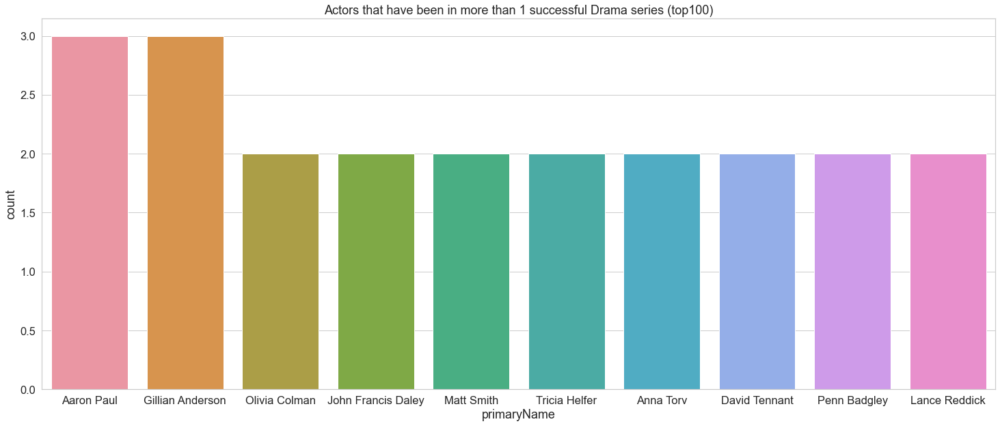

In [129]:
sns.set_palette("Set2")
sns.set_style("whitegrid")
fig,axs=plt.subplots(figsize=(25,10))
g=sns.barplot(x=top_actors['primaryName'][:10],y=top_actors['count'][:10])
g.set_title("Actors that have been in more than 1 successful Drama series (top100)")
plt.show()

In [130]:
principals_ratings2= pd.merge(series_ratings, df_principals, on="tconst")
actors_writers_directors = pd.merge(principals_ratings2, df_name_basics, on="nconst")
#actors = pd.merge(principals_ratings, df_name_basics, on="nconst")     fazer só este pra ficar só com actors

In [131]:
actors_writers_directors

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,...,ordering,nconst,category,job,characters,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,...,10,nm0322513,actor,\N,"[""Jorah Mormont""]",Iain Glen,1961.0,NaN,"actor,producer,soundtrack","tt6954652,tt0944947,tt10370380,tt6859806"
1,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,...,1,nm3592338,actress,\N,"[""Daenerys Targaryen""]",Emilia Clarke,1986.0,NaN,"actress,soundtrack","tt1340138,tt2674426,tt3778644,tt0944947"
2,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,...,2,nm0227759,actor,\N,"[""Tyrion Lannister""]",Peter Dinklage,1969.0,NaN,"actor,producer,soundtrack","tt5027774,tt1877832,tt0944947,tt0340377"
3,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,...,3,nm3229685,actor,\N,"[""Jon Snow""]",Kit Harington,1986.0,NaN,"actor,writer,producer","tt9032400,tt0944947,tt1921064,tt0938330"
4,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,...,4,nm0372176,actress,\N,"[""Cersei Lannister""]",Lena Headey,1973.0,NaN,"actress,producer,soundtrack","tt1343727,tt1374989,tt0944947,tt0416449"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,...,5,nm1104036,writer,created by,\N,Jesse Armstrong,NaN,NaN,"writer,producer,miscellaneous","tt7660850,tt1226774,tt2058303,tt1341167"
992,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,...,6,nm0001085,actor,\N,"[""Roman Roy""]",Kieran Culkin,1982.0,NaN,actor,"tt0280760,tt7660850,tt0446029,tt0124315"
993,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,...,7,nm0001688,actor,\N,"[""Connor Roy""]",Alan Ruck,1956.0,NaN,"actor,soundtrack","tt0111257,tt0111280,tt0091042,tt0117998"
994,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,...,8,nm3512758,actress,\N,"[""Shiv Roy""]",Sarah Snook,1987.0,NaN,"actress,soundtrack","tt2080374,tt2397535,tt2910904,tt7660850"


In [132]:
actors_writers_directors.isna().sum()

tconst                        0
titleType                     0
primaryTitle                  0
originalTitle                 0
isAdult                       0
startYear                     0
endYear                     216
runtimeMinutes                0
genres                        0
averageRating                 0
numVotes                      0
Episodes Time In Minutes      0
ordering                      0
nconst                        0
category                      0
job                           0
characters                    0
primaryName                   0
birthYear                    96
deathYear                   981
primaryProfession             2
knownForTitles                0
dtype: int64

In [ ]:
import pandas
pandas.set_option('display.max_rows', None)

In [133]:
actors_writers_directors=actors_writers_directors[(actors_writers_directors.primaryName=="Aaron Paul") | (actors_writers_directors.primaryName=="Gillian Anderson") | (actors_writers_directors.primaryName=="Olivia Colman") | (actors_writers_directors.primaryName=="John Francis Daley") | (actors_writers_directors.primaryName=="Matt Smith") | (actors_writers_directors.primaryName=="Tricia Helfer") | (actors_writers_directors.primaryName=="Anna Torv") |(actors_writers_directors.primaryName=="David Tennant") |(actors_writers_directors.primaryName=="Penn Badgley") |(actors_writers_directors.primaryName=="Lance Reddick") |(actors_writers_directors.primaryName=="Seth Gilliam") |(actors_writers_directors.primaryName=="Wendell Pierce") |(actors_writers_directors.primaryName=="Dominic West") |(actors_writers_directors.primaryName=="Martin Freeman") |(actors_writers_directors.primaryName=="Jon Bernthal") |(actors_writers_directors.primaryName=="Morena Baccarin") |(actors_writers_directors.primaryName=="Rockmond Dunbar") |(actors_writers_directors.primaryName=="Andrew Scott") |(actors_writers_directors.primaryName=="Gina Torres") |(actors_writers_directors.primaryName=="Elisabeth Moss") |(actors_writers_directors.primaryName=="Alexander Skarsgård") |(actors_writers_directors.primaryName=="Jonathan Banks") |(actors_writers_directors.primaryName=="Akdas Hayat") |(actors_writers_directors.primaryName=="David Duchovny") |(actors_writers_directors.primaryName=="James Purefoy") |(actors_writers_directors.primaryName=="Bob Odenkirk") |(actors_writers_directors.primaryName=="Mädchen Amick") |(actors_writers_directors.primaryName=="Tobias Menzies") |(actors_writers_directors.primaryName=="Milo Ventimiglia") |(actors_writers_directors.primaryName=="Kevin McKidd") |(actors_writers_directors.primaryName=="Nathan Fillion")|(actors_writers_directors.primaryName=="Vince Gilligan") | (actors_writers_directors.primaryName=="Joss Whedon") | (actors_writers_directors.primaryName=="J.J. Abrams") | (actors_writers_directors.primaryName=="Jeff Davis") | (actors_writers_directors.primaryName=="Greg Berlanti") | (actors_writers_directors.primaryName=="Bruno Heller")|(actors_writers_directors.primaryName=="Bronwen Hughes") | (actors_writers_directors.primaryName=="David Petrarca") | (actors_writers_directors.primaryName=="Bobby Roth") | (actors_writers_directors.primaryName=="Silver Tree") | (actors_writers_directors.primaryName=="Craig Zisk") | (actors_writers_directors.primaryName=="Dan Lerner")][["primaryName","primaryTitle","characters","numVotes", "averageRating","startYear","genres","knownForTitles","nconst","tconst"]]

In [134]:
known_for_titles=actors_writers_directors['tconst'].tolist()
name_IDs=actors_writers_directors['nconst'].tolist()
names = actors_writers_directors['primaryName'].tolist()

In [135]:
from collections import defaultdict

In [136]:
name_title_dict= defaultdict(list)
for k, v in zip(name_IDs, known_for_titles):
    name_title_dict[k].append(v)

In [137]:
name_title_dict

defaultdict(list,
            {'nm0052186': ['tt0903747', 'tt3032476'],
             'nm0666739': ['tt0903747', 'tt2085059', 'tt3398228'],
             'nm0319213': ['tt0903747', 'tt3032476'],
             'nm0644022': ['tt0903747', 'tt3032476'],
             'nm0319121': ['tt1520211', 'tt0306414'],
             'nm0293509': ['tt1475582', 'tt2802850'],
             'nm0778831': ['tt1475582', 'tt5687612'],
             'nm0009190': ['tt0411008', 'tt1119644'],
             'nm0241870': ['tt0455275', 'tt1196946'],
             'nm1256532': ['tt3322312', 'tt5675620'],
             'nm0868659': ['tt1632701', 'tt0303461'],
             'nm0682495': ['tt1632701', 'tt0306414'],
             'nm0075528': ['tt3107288', 'tt7335184'],
             'nm1072555': ['tt1796960', 'tt0303461'],
             'nm0922035': ['tt0306414', 'tt4786824'],
             'nm0714698': ['tt0306414', 'tt1119644'],
             'nm1065454': ['tt4052886', 'tt0407362'],
             'nm0571727': ['tt0413573', 'tt0384766'

In [138]:
ID_name_dict= dict(zip(name_IDs, names))

In [139]:
ID_name_dict

{'nm0052186': 'Jonathan Banks',
 'nm0666739': 'Aaron Paul',
 'nm0319213': 'Vince Gilligan',
 'nm0644022': 'Bob Odenkirk',
 'nm0319121': 'Seth Gilliam',
 'nm0293509': 'Martin Freeman',
 'nm0778831': 'Andrew Scott',
 'nm0009190': 'J.J. Abrams',
 'nm0241870': 'Rockmond Dunbar',
 'nm1256532': 'Jon Bernthal',
 'nm0868659': 'Gina Torres',
 'nm0682495': 'Wendell Pierce',
 'nm0075528': 'Greg Berlanti',
 'nm1072555': 'Morena Baccarin',
 'nm0922035': 'Dominic West',
 'nm0714698': 'Lance Reddick',
 'nm1065454': 'Tricia Helfer',
 'nm0571727': 'Kevin McKidd',
 'nm13330335': 'Akdas Hayat',
 'nm1396022': 'Anna Torv',
 'nm0000096': 'Gillian Anderson',
 'nm0277213': 'Nathan Fillion',
 'nm0923736': 'Joss Whedon',
 'nm0002907': 'Alexander Skarsgård',
 'nm0893257': 'Milo Ventimiglia',
 'nm0005253': 'Elisabeth Moss',
 'nm0046112': 'Penn Badgley',
 'nm0375285': 'Bruno Heller',
 'nm0000141': 'David Duchovny',
 'nm1741002': 'Matt Smith',
 'nm0855039': 'David Tennant',
 'nm1469236': 'Olivia Colman',
 'nm058001

In [140]:
title_IDs=actors_writers_directors['tconst'].tolist()
titles=actors_writers_directors['primaryTitle'].tolist()

In [141]:
ID_title_dict= dict(zip(title_IDs, titles))

In [142]:
ID_title_dict

{'tt0903747': 'Breaking Bad',
 'tt3032476': 'Better Call Saul',
 'tt2085059': 'Black Mirror',
 'tt3398228': 'BoJack Horseman',
 'tt1520211': 'The Walking Dead',
 'tt0306414': 'The Wire',
 'tt1475582': 'Sherlock',
 'tt2802850': 'Fargo',
 'tt5687612': 'Fleabag',
 'tt0411008': 'Lost',
 'tt1119644': 'Fringe',
 'tt0455275': 'Prison Break',
 'tt1196946': 'The Mentalist',
 'tt3322312': 'Daredevil',
 'tt5675620': 'The Punisher',
 'tt1632701': 'Suits',
 'tt0303461': 'Firefly',
 'tt3107288': 'The Flash',
 'tt7335184': 'You',
 'tt1796960': 'Homeland',
 'tt4786824': 'The Crown',
 'tt4052886': 'Lucifer',
 'tt0407362': 'Battlestar Galactica',
 'tt0413573': "Grey's Anatomy",
 'tt0384766': 'Rome',
 'tt14392248': 'Aspirants',
 'tt12392504': 'Scam 1992: The Harshad Mehta Story',
 'tt5290382': 'Mindhunter',
 'tt7767422': 'Sex Education',
 'tt2243973': 'Hannibal',
 'tt0106179': 'The X-Files',
 'tt1219024': 'Castle',
 'tt2364582': 'Agents of S.H.I.E.L.D.',
 'tt0118276': 'Buffy the Vampire Slayer',
 'tt0844

In [143]:
g=nx.Graph()
edge_attribute_dict = {}

In [144]:
for name_ID, titles in name_title_dict.items():
    g.add_node(name_ID)
    for title in titles:
        if title in title_IDs:
            for name_ID2, titles2 in name_title_dict.items():
                if(title in titles2) and (titles2 != titles):
                    g.add_edge(name_ID, name_ID2)
                    name_ID_tuple= tuple(sorted((name_ID,name_ID2)))
                    if name_ID_tuple not in edge_attribute_dict:
                        edge_attribute_dict[name_ID_tuple] = 1
                    else:
                        edge_attribute_dict[name_ID_tuple] += 1
                        

In [145]:
for k, v in edge_attribute_dict.items():
    edge_attribute_dict[k]={'weight':v}

nx.set_edge_attributes(g, edge_attribute_dict)

In [146]:
#actors, writers and directors with the most direct tvseries connections, meaning the tvseries they are known for that are in common with the most other actors, writers directors' tvseries they are known for
centrality= nx.degree_centrality(g)
[(ID_name_dict[x], centrality[x]) for x in sorted(centrality, key=centrality.get, reverse=True)[:30]]

[('Dominic West', 0.16666666666666666),
 ('Lance Reddick', 0.1388888888888889),
 ('Wendell Pierce', 0.1111111111111111),
 ('Olivia Colman', 0.1111111111111111),
 ('Gina Torres', 0.1111111111111111),
 ('Matt Smith', 0.1111111111111111),
 ('Aaron Paul', 0.08333333333333333),
 ('Seth Gilliam', 0.08333333333333333),
 ('Bruno Heller', 0.08333333333333333),
 ('Morena Baccarin', 0.08333333333333333),
 ('Nathan Fillion', 0.08333333333333333),
 ('Joss Whedon', 0.08333333333333333),
 ('Tobias Menzies', 0.08333333333333333),
 ('Andrew Scott', 0.05555555555555555),
 ('J.J. Abrams', 0.05555555555555555),
 ('Anna Torv', 0.05555555555555555),
 ('Kevin McKidd', 0.05555555555555555),
 ('James Purefoy', 0.05555555555555555),
 ('Jonathan Banks', 0.027777777777777776),
 ('Vince Gilligan', 0.027777777777777776),
 ('Bob Odenkirk', 0.027777777777777776),
 ('Martin Freeman', 0.027777777777777776),
 ('Rockmond Dunbar', 0.027777777777777776),
 ('Greg Berlanti', 0.027777777777777776),
 ('Penn Badgley', 0.0277777

In [147]:
[(ID_name_dict[x], [ID_title_dict[title] for title in name_title_dict[x]\
                   if title in ID_title_dict]) for x in sorted(centrality, key=centrality.get, reverse=True)]

[('Dominic West', ['The Wire', 'The Crown']),
 ('Lance Reddick', ['The Wire', 'Fringe']),
 ('Wendell Pierce', ['Suits', 'The Wire']),
 ('Olivia Colman', ['The Crown', 'Fleabag']),
 ('Gina Torres', ['Suits', 'Firefly']),
 ('Matt Smith', ['Doctor Who', 'The Crown']),
 ('Aaron Paul', ['Breaking Bad', 'Black Mirror', 'BoJack Horseman']),
 ('Seth Gilliam', ['The Walking Dead', 'The Wire']),
 ('Bruno Heller', ['Gotham', 'The Mentalist', 'Rome']),
 ('Morena Baccarin', ['Homeland', 'Firefly']),
 ('Nathan Fillion', ['Firefly', 'Castle']),
 ('Joss Whedon',
  ['Firefly', 'Agents of S.H.I.E.L.D.', 'Buffy the Vampire Slayer']),
 ('Tobias Menzies', ['The Crown', 'Outlander']),
 ('Andrew Scott', ['Sherlock', 'Fleabag']),
 ('J.J. Abrams', ['Lost', 'Fringe']),
 ('Anna Torv', ['Mindhunter', 'Fringe']),
 ('Kevin McKidd', ["Grey's Anatomy", 'Rome']),
 ('James Purefoy', ['Rome', 'Altered Carbon']),
 ('Jonathan Banks', ['Breaking Bad', 'Better Call Saul']),
 ('Vince Gilligan', ['Breaking Bad', 'Better Call 

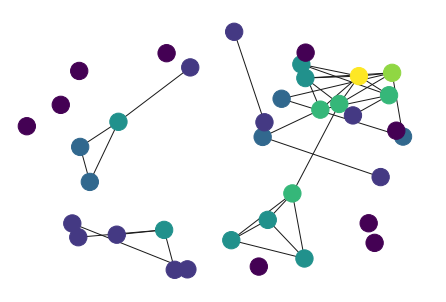

In [148]:
pos= nx.spring_layout(g,k=1)
max_c=max(centrality.values())
color_map={x[0]:x[1]/max_c for x in centrality.items()}
nx.draw(g, pos, node_color=list(color_map.values()), cmap=plt.cm.viridis, with_labels=False)
plt.show()

In [149]:
G = nx.from_pandas_edgelist(actors_writers_directors, 'primaryTitle','primaryName')

In [150]:
list(nx.all_shortest_paths(G, 'Jonathan Banks', 'Bob Odenkirk'))

[['Jonathan Banks', 'Breaking Bad', 'Bob Odenkirk'],
 ['Jonathan Banks', 'Better Call Saul', 'Bob Odenkirk']]

In [151]:
list(nx.all_shortest_paths(G, 'Jonathan Banks', 'Vince Gilligan'))

[['Jonathan Banks', 'Breaking Bad', 'Vince Gilligan'],
 ['Jonathan Banks', 'Better Call Saul', 'Vince Gilligan']]

In [152]:
list(nx.all_shortest_paths(G, 'Bob Odenkirk', 'Vince Gilligan'))

[['Bob Odenkirk', 'Breaking Bad', 'Vince Gilligan'],
 ['Bob Odenkirk', 'Better Call Saul', 'Vince Gilligan']]

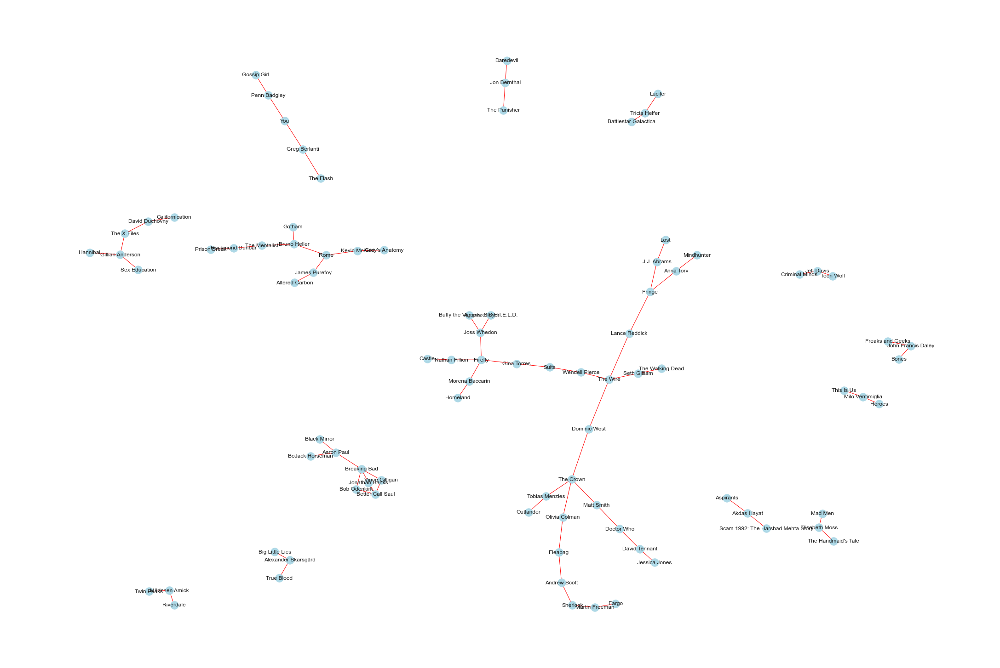

In [155]:
plt.figure(figsize=(30,20))
nx.draw(G, node_color='lightblue', with_labels=True,node_size=300, edge_color="red")

In [156]:
#In 100 Drama Series, 2 of them have an averageRating below 7. A 6.8 and a 6.6 is not bad but it's not great
#Still, both of these series have over 140k votes, showing, once again
series_ratings[series_ratings.averageRating<7]

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes,Episodes Time In Minutes
37726,tt1327801,tvSeries,Glee,Glee,0.0,2009.0,2015.0,44,"Comedy,Drama,Music",6.8,148052,Between 40 and 60
69005,tt5420376,tvSeries,Riverdale,Riverdale,0.0,2017.0,NaN,45,"Crime,Drama,Mystery",6.6,144168,Between 40 and 60


In [157]:
episodes_ratings = pd.merge(df_episode, df_ratings, on="tconst")

In [158]:
episodes_ratings

,tconst,parentTconst,seasonNumber,episodeNumber,averageRating,numVotes
0,tt0020666,tt15180956,1,2,6.3,236
1,tt0020829,tt15180956,1,1,6.1,353
2,tt0021166,tt15180956,1,3,6.7,264
3,tt0021612,tt15180956,2,2,5.4,95
4,tt0021655,tt15180956,2,5,6.7,75
...,...,...,...,...,...,...
612784,tt9916670,tt0985991,3,43,6.4,5
612785,tt9916682,tt0985991,3,44,5.7,6
612786,tt9916690,tt0985991,3,47,6.5,6
612787,tt9916766,tt1442550,10,15,6.8,21


In [159]:
tvseries_episodes_ratings = pd.merge(series_ratings, episodes_ratings, left_on='tconst', right_on='parentTconst')

In [160]:
tvseries_episodes_ratings

,tconst_x,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating_x,numVotes_x,Episodes Time In Minutes,tconst_y,parentTconst,seasonNumber,episodeNumber,averageRating_y,numVotes_y
0,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,tt1480055,tt0944947,1,1,8.9,49066
1,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,tt1668746,tt0944947,1,2,8.6,37113
2,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,tt1829962,tt0944947,1,3,8.5,35115
3,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,tt1829963,tt0944947,1,4,8.6,33378
4,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,tt1829964,tt0944947,1,5,9.0,34700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9248,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,tt7660912,tt7660850,1,9,8.5,3519
9249,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,tt7660914,tt7660850,1,10,9.2,4853
9250,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,tt8543048,tt7660850,2,1,8.4,3546
9251,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,tt9899086,tt7660850,2,2,8.5,3442


In [161]:
tvseries_episodes_ratings.isna().sum()

tconst_x                       0
titleType                      0
primaryTitle                   0
originalTitle                  0
isAdult                        0
startYear                      0
endYear                     1966
runtimeMinutes                 0
genres                         0
averageRating_x                0
numVotes_x                     0
Episodes Time In Minutes       0
tconst_y                       0
parentTconst                   0
seasonNumber                   0
episodeNumber                  0
averageRating_y                0
numVotes_y                     0
dtype: int64

In [162]:
tmp1 = tvseries_episodes_ratings[(tvseries_episodes_ratings['seasonNumber'] != '\\N') &
                                       (tvseries_episodes_ratings['episodeNumber'] != '\\N')]
tmp1[['seasonNumber', 'episodeNumber']] = tmp1[['seasonNumber', 'episodeNumber']].astype(int)
#tmp1.loc[tmp1.endYear == 'NaN', 'endYear'] = ''
tmp1['sumEpisodeRating'] = tmp1['averageRating_y'] * tmp1['numVotes_y']
xyz = tmp1.groupby('tconst_x')['sumEpisodeRating'].sum()/tmp1.groupby('tconst_x')['numVotes_y'].sum()

abc1 = xyz.to_frame().reset_index(level='tconst_x').rename(columns={0: "wtd_mean_averageRating"})
abc2 = tmp1.groupby('tconst_x')[['averageRating_y', 'numVotes_y']].mean().reset_index(level='tconst_x').rename(columns={'averageRating_y': "mean_averageRating", "numVotes_y": "mean_numVotes"})
abc3 = tmp1.groupby('tconst_x')[['averageRating_y', 'numVotes_y']].std().reset_index(level='tconst_x').rename(columns={'averageRating_y': "stdDev_averageRating", "numVotes_y": "stdDev_numVotes"})
abc4 = tmp1.groupby('tconst_x')[['averageRating_y', 'numVotes_y']].median().reset_index(level='tconst_x').rename(columns={'averageRating_y': "median_averageRating", "numVotes_y": "median_numVotes"})
abc5 = tmp1.groupby('tconst_x')[['averageRating_y', 'numVotes_y']].min().reset_index(level='tconst_x').rename(columns={'averageRating_y': "min_averageRating", "numVotes_y": "min_numVotes"})
abc6 = tmp1.groupby('tconst_x')[['averageRating_y', 'numVotes_y', 'seasonNumber']].max().reset_index(level='tconst_x').rename(columns={'averageRating_y': "max_averageRating", "numVotes_y": "max_numVotes", "seasonNumber": "numSeasons"})

abc8 = tmp1.groupby('tconst_x')['numVotes_y'].sum().reset_index(level='tconst_x').rename(columns={'numVotes_y': "total_numVotes"})
abc9 = tmp1.groupby('tconst_x')['episodeNumber'].count().reset_index(level='tconst_x').rename(columns={'episodeNumber': "total_episodes"})
abc10 = tmp1.groupby('tconst_x')[['averageRating_y']].quantile(0.125).reset_index(level='tconst_x').rename(columns={'averageRating_y': "q1a_averageRating"})
abc11 = tmp1.groupby('tconst_x')[['averageRating_y']].quantile(0.875).reset_index(level='tconst_x').rename(columns={'averageRating_y': "q3a_averageRating"})
abc12 = tmp1.groupby('tconst_x')[['averageRating_y']].quantile(0.25).reset_index(level='tconst_x').rename(columns={'averageRating_y': "q1_averageRating"})
abc13 = tmp1.groupby('tconst_x')[['averageRating_y']].quantile(0.75).reset_index(level='tconst_x').rename(columns={'averageRating_y': "q3_averageRating"})


tmp2 = pd.merge(tmp1, abc1, on='tconst_x')
tmp3 = pd.merge(tmp2, abc2, on='tconst_x')
tmp4 = pd.merge(tmp3, abc3, on='tconst_x')
tmp5 = pd.merge(tmp4, abc4, on='tconst_x')
tmp6 = pd.merge(tmp5, abc5, on='tconst_x')
tmp7 = pd.merge(tmp6, abc6, on='tconst_x')
tmp8 = pd.merge(tmp7, abc12, on='tconst_x')
tmp8a = pd.merge(tmp8, abc13, on='tconst_x')
tmp9 = pd.merge(tmp8a, abc8, on='tconst_x')
tmp10 = pd.merge(tmp9, abc9, on='tconst_x')
tmp11 = pd.merge(tmp10, abc10, on='tconst_x')
tmp12 = pd.merge(tmp11, abc11, on='tconst_x')
tmp13 = tmp12.groupby(['tconst_x', 'primaryTitle', 'startYear', 'genres', 'titleType']).mean().reset_index()
tmp13['rel_avgRatingDeviation_pc'] = (tmp13['averageRating_x'] - tmp13['median_averageRating'])/tmp13['averageRating_x']*100
tmp13['rel_medDevRating_pc'] = (tmp13['q3a_averageRating'] - tmp13['q1a_averageRating'])/tmp13['median_averageRating']*100
tmp13['seasonGroup'] = tmp13['numSeasons'].apply(lambda x: '1' if x < 2 else ('2-4' if x < 5 else '5+'))
tmp13['yearGroup'] = tmp13['startYear'].apply(lambda x: 'Before 2000' if int(x) < 2000 else '2000-2010' if (int(x) >=2000 and int(x) <2010) else '2010-2022')

tvseries_episodes_ratings_stats = tmp13.rename(columns={'tconst_x': "id", "averageRating_x": 
                                                                "averageRating", "numVotes_x": "numVotes"})
tvseries_episodes_ratings_stats = tvseries_episodes_ratings_stats[tvseries_episodes_ratings_stats['numSeasons'] >= 1]
tvseries_episodes_ratings_popular = tvseries_episodes_ratings_stats[(tvseries_episodes_ratings_stats['median_numVotes']>= 1)]
tvseries_episodes_ratings_popular['showTitle'] = tvseries_episodes_ratings_popular["primaryTitle"] + " (" + tvseries_episodes_ratings_popular["startYear"].astype(str) + "-" + tvseries_episodes_ratings_popular["endYear"].astype(str) + ")"
tvseries_episodes_ratings_popular['series_episodes_rating'] = tvseries_episodes_ratings_popular["numSeasons"].astype(int).astype(str) + ", " + tvseries_episodes_ratings_popular["total_episodes"].astype(int).astype(str) + ", " + tvseries_episodes_ratings_popular["averageRating"].round(3).astype(str)
tvseries_episodes_ratings_popular['median_mean_rating'] = tvseries_episodes_ratings_popular["median_averageRating"].round(3).astype(str) + ", " + tvseries_episodes_ratings_popular["mean_averageRating"].round(3).astype(str)


C:\Users\maria\AppData\Local\Temp\ipykernel_13076\2591607449.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\maria\AppData\Local\Temp\ipykernel_13076\2591607449.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [163]:
df = tvseries_episodes_ratings_popular.copy()
df['size'] = 7

from bokeh.plotting import figure, output_file, output_notebook, show, save, ColumnDataSource
from bokeh.models import HoverTool, CategoricalColorMapper, Legend, LegendItem, CustomJS
from bokeh.transform import factor_mark, factor_cmap 
from bokeh.palettes import Category10
from bokeh.events import DoubleTap


output_file("TV Series Rating vs TV Series' mean episode rating (Interactive plot).html")

source = ColumnDataSource(data=df)

p = figure(plot_width=900, plot_height=600, tools=["box_zoom"], 
           title="TV Series Rating vs TV Series' Mean Episode Rating (Top 100 Drama Series)")

p.js_on_event(DoubleTap, CustomJS(args=dict(p=p), code='p.reset.emit()'))

COLOR_FACTORS = ['Before 2000', '2000-2010', '2010-2022']
MARKER_FACTORS = ['1', '2-4', '5+']
MARKERS = ['triangle', 'square', 'circle']

x = np.array(df['mean_averageRating'])
y = np.array(df['averageRating'])

slope = 1
intercept = 0
## plot y = x
y_predicted = [slope*i + intercept  for i in x]

line = p.line(x, y_predicted, color='green')
scatter = p.scatter('mean_averageRating', 'averageRating', size='size', source=source, alpha=0.5,
                  color=factor_cmap("yearGroup", Category10[3], COLOR_FACTORS),
                   marker=factor_mark('seasonGroup', MARKERS, MARKER_FACTORS))

hover = HoverTool(tooltips=[
    ("Title", "@showTitle"),
    ("Seasons, Episodes, Rating", "@series_episodes_rating"),
    ("Median, Mean episode rating", "@median_mean_rating"),
    ("Relative rating deviation %", "@rel_avgRatingDeviation_pc"),
    ("Genres", "@genres"),
], renderers=[scatter])

p.add_tools(hover)

# create an invisible renderer to drive color legend
rc = p.rect(x=4, y=9, height=1, width=1, color=Category10[4])
rc.visible = False

# add a color legend with explicit index, set labels to fit your need
legend = Legend(items=[
    LegendItem(label=COLOR_FACTORS[i], renderers=[rc], index=i) for i, c in enumerate(Category10[3])
], location="top_left")
legend.title = 'TV Series Start Year'
p.add_layout(legend)

# create an invisible renderer to drive shape legend
rs = p.scatter(x=10, y=10,size=15, marker=MARKERS)
rs.visible = False

# add a shape legend with explicit index, set labels to fit your needs
legend = Legend(items=[
    LegendItem(label=MARKER_FACTORS[i], renderers=[rs], index=i) for i, s in enumerate(MARKER_FACTORS)
], location="center_left")
legend.title = 'Number of Seasons'

p.add_layout(legend)
p.title.align = 'center'
p.xaxis.axis_label = 'TV Series mean episode rating'
p.yaxis.axis_label = 'TV Series rating'
p.background_fill_color = "white"
p.xaxis.axis_label_text_font_size = "12pt"
p.yaxis.axis_label_text_font_size = "12pt"
p.title.text_font_size = '12pt'

show(p)

In [164]:
tvseries_episodes_ratings

,tconst_x,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating_x,numVotes_x,Episodes Time In Minutes,tconst_y,parentTconst,seasonNumber,episodeNumber,averageRating_y,numVotes_y
0,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,tt1480055,tt0944947,1,1,8.9,49066
1,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,tt1668746,tt0944947,1,2,8.6,37113
2,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,tt1829962,tt0944947,1,3,8.5,35115
3,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,tt1829963,tt0944947,1,4,8.6,33378
4,tt0944947,tvSeries,Game of Thrones,Game of Thrones,0.0,2011.0,2019.0,57,"Action,Adventure,Drama",9.2,2060874,Between 40 and 60,tt1829964,tt0944947,1,5,9.0,34700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9248,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,tt7660912,tt7660850,1,9,8.5,3519
9249,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,tt7660914,tt7660850,1,10,9.2,4853
9250,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,tt8543048,tt7660850,2,1,8.4,3546
9251,tt7660850,tvSeries,Succession,Succession,0.0,2018.0,NaN,60,Drama,8.8,141761,Between 60 and 90,tt9899086,tt7660850,2,2,8.5,3442


C:\Users\maria\AppData\Local\Temp\ipykernel_13076\359066072.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\maria\AppData\Local\Temp\ipykernel_13076\359066072.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Text(0.5, 1.0, 'Episode rating over number of seasons (Top 100 Drama Series)')

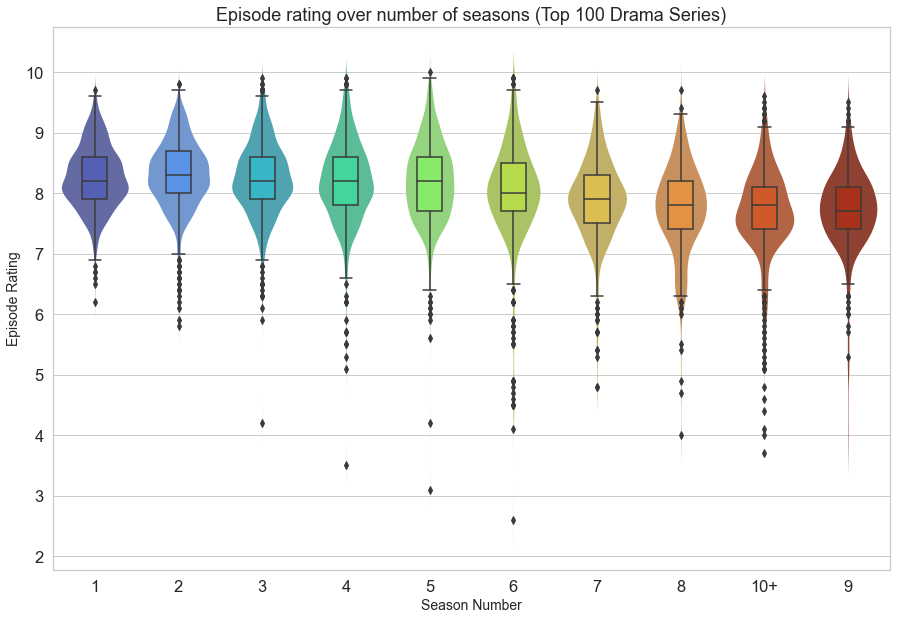

In [165]:
df = tvseries_episodes_ratings[tvseries_episodes_ratings['seasonNumber'] != '\\N']
df['seasonNumber'] = tvseries_episodes_ratings[tvseries_episodes_ratings['seasonNumber'] != '\\N']['seasonNumber'].astype(int)
df['season'] = df['seasonNumber'].apply(lambda x: str(x) if x < 10 else '10+')

order = ['1','2','3','4','5','6','7','8','9','10+']

fig = plt.figure(figsize=(15,10))
ax = sns.violinplot(x="season", y="averageRating_y", data=df,order=order, palette='turbo',inner=None, linewidth=0, saturation=0.5)
sns.boxplot(x='season', y='averageRating_y', data=df, palette='turbo', width=0.3,
            boxprops={'zorder': 2}, ax=ax)
ax.set_xlabel("Season Number",fontsize=14)
ax.set_ylabel("Episode Rating",fontsize=14)
plt.title(label='Episode rating over number of seasons (Top 100 Drama Series)', fontsize=18)


#Color ---> turbo, cool ou Spectral

In [167]:
df = tvseries_episodes_ratings[tvseries_episodes_ratings['seasonNumber'] != '\\N']
df['seasonNumber'] = tvseries_episodes_ratings[tvseries_episodes_ratings['seasonNumber'] != '\\N']['seasonNumber'].astype(int)
df['season'] = df['seasonNumber'].apply(lambda x: str(x) if x < 10 else '10+')

fig = px.violin(df,y='averageRating_y', x='season', color="season", box=True,category_orders={'season':['1','2','3','4','5','6','7','8','9','10+']},labels={'season':'Season Number', 'averageRating_y': 'Episode Rating'}
          ,hover_data=df.columns)
fig.update_layout(title_text='Episode Rating over Number of Seasons (Top 100 Drama Series)',title_x=0.5)
fig.show()
fig.write_html("C:/Users/maria/Desktop/Plots/Episode Rating over Number of Seasons.html")

C:\Users\maria\AppData\Local\Temp\ipykernel_13076\3450443476.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\maria\AppData\Local\Temp\ipykernel_13076\3450443476.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [168]:
#justificação pra subir um pouco nas 10+ : Doctor who e American Horror Story vão mudando de elenco e de storyline

In [169]:
newabc1 = tmp1.groupby(['tconst_x', 'seasonNumber'])[['averageRating_y']].mean().reset_index(level=['tconst_x', 'seasonNumber'])
newtmp2 = pd.merge(newabc1, tmp1, on=['tconst_x', 'seasonNumber'])
newtmp2.describe(include='all')
newtmp3 = newtmp2.groupby(['tconst_x', 'seasonNumber'])['averageRating_y_x'].mean().reset_index()
newtmp3a = newtmp2.groupby(['tconst_x', 'seasonNumber'])['episodeNumber'].max().reset_index()
newtmp3['max_mean_rating'] = newtmp3.groupby('tconst_x')['averageRating_y_x'].transform(max)
newtmp3['last_season'] = newtmp3.groupby('tconst_x')['seasonNumber'].transform(max)
newtmp4 = newtmp3[newtmp3['max_mean_rating'] == newtmp3['averageRating_y_x']]
newtmp5 = newtmp4.groupby('tconst_x')[['seasonNumber', 'max_mean_rating']].max().reset_index()

# pilot rating
pilot = tmp1[(tmp1['seasonNumber'] == 1) & (tmp1['episodeNumber'] == 1)]
pilot = pilot[['tconst_x', 'averageRating_y']]
pilot.rename(columns={'averageRating_y':'pilot_rating'}, inplace=True)

# best rating
newtmp5.rename(columns={'seasonNumber':'best_season'}, inplace=True)
# last season
newtmp4a = newtmp3[newtmp3['last_season'] == newtmp3['seasonNumber']]
newtmp5a = newtmp4a.groupby('tconst_x')[['last_season', 'averageRating_y_x']].mean().reset_index()
newtmp5a.rename(columns={'averageRating_y_x':'last_season_mean_rating'}, inplace=True)

# finale rating
newtmp3b = pd.merge(tmp1, newtmp3a, on=['tconst_x', 'seasonNumber', 'episodeNumber'])
finale = pd.merge(newtmp3b, newtmp4a, left_on=['tconst_x','seasonNumber'], right_on=['tconst_x','seasonNumber'])
finale = finale[['tconst_x', 'averageRating_y']]
finale.rename(columns={'averageRating_y':'finale_rating'}, inplace=True)



# full data
newtmp6_1 = pd.merge(newtmp5, finale, on='tconst_x')
newtmp6a = pd.merge(newtmp6_1, newtmp5a, on='tconst_x')

newtmp6 = pd.merge(newtmp6a, pilot, on='tconst_x')
newtmp6.rename(columns={'tconst_x':'id'}, inplace=True)

newtmp7 = pd.merge(tvseries_episodes_ratings_popular, newtmp6, on='id')
newtmp7 = newtmp7[newtmp7['endYear'] != '']
newtmp7['seasonGroup'] = newtmp7['numSeasons'].apply(lambda x: str(int(x)) if x <10 else '10+')
newtmp7['rel_finalSeasonDeviation_pc'] = (newtmp7['last_season_mean_rating'] - newtmp7['mean_averageRating'])/newtmp7['mean_averageRating']*100

newtmp5b = pd.merge(newtmp3, newtmp5, on='tconst_x')
newtmp_5c = newtmp5b[newtmp5b['seasonNumber'] <= newtmp5b['best_season']]
newtmp_5d = newtmp5b[newtmp5b['seasonNumber'] > newtmp5b['best_season']]

newtmp_5e = newtmp_5c.groupby('tconst_x')['averageRating_y_x'].mean().reset_index()
newtmp_5f = newtmp_5d.groupby('tconst_x')['averageRating_y_x'].mean().reset_index()

newtmp8 = pd.merge(newtmp_5e, newtmp_5f, on='tconst_x', how='outer')
newtmp8.rename(columns={'tconst_x':'id', 'averageRating_y_x_x': 'mean_before_peak', 'averageRating_y_x_y': 'mean_after_peak'}, inplace=True)

tvseries_episodes_ratings_popular_full = pd.merge(newtmp7, newtmp8, on='id')
tvseries_episodes_ratings_popular_full.mean_after_peak.fillna(tvseries_episodes_ratings_popular_full.mean_before_peak, inplace=True)

tvseries_episodes_ratings_popular_full['mean_before_after_peak_finale'] = tvseries_episodes_ratings_popular_full["mean_before_peak"].round(3).astype(str) + ", " + tvseries_episodes_ratings_popular_full["mean_after_peak"].round(3).astype(str) + ", " + tvseries_episodes_ratings_popular_full["last_season_mean_rating"].round(3).astype(str)




In [170]:
tvseries_episodes_ratings_popular_full

,id,primaryTitle,startYear,genres,titleType,isAdult,endYear,runtimeMinutes,averageRating,numVotes,...,best_season,max_mean_rating,finale_rating,last_season,last_season_mean_rating,pilot_rating,rel_finalSeasonDeviation_pc,mean_before_peak,mean_after_peak,mean_before_after_peak_finale
0,tt0098936,Twin Peaks,1990.0,"Crime,Drama,Mystery",tvSeries,0.0,1991.0,47.0,8.8,196505.0,...,1,8.537500,9.2,2.0,8.145455,8.9,-1.267218,8.537500,8.145455,"8.538, 8.145, 8.145"
1,tt0106179,The X-Files,1993.0,"Crime,Drama,Mystery",tvSeries,0.0,2018.0,45.0,8.6,223868.0,...,6,8.127273,7.3,11.0,7.470000,8.3,-4.383295,7.950462,7.534529,"7.95, 7.535, 7.47"
2,tt0118276,Buffy the Vampire Slayer,1997.0,"Action,Drama,Fantasy",tvSeries,0.0,2003.0,44.0,8.3,146290.0,...,3,8.331818,9.3,7.0,7.995455,7.9,-0.082659,7.956527,7.984091,"7.957, 7.984, 7.995"
3,tt0141842,The Sopranos,1999.0,"Crime,Drama",tvSeries,0.0,2007.0,55.0,9.2,391640.0,...,3,8.707692,9.3,6.0,8.680952,8.5,0.723409,8.641026,8.583394,"8.641, 8.583, 8.681"
4,tt0165598,That '70s Show,1998.0,"Comedy,Drama,Romance",tvSeries,0.0,2006.0,22.0,8.1,170051.0,...,1,7.864000,8.8,8.0,6.663636,7.9,-11.305253,7.864000,7.445757,"7.864, 7.446, 6.664"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,tt7335184,You,2018.0,"Crime,Drama,Romance",tvSeries,0.0,NaN,45.0,7.7,234950.0,...,2,8.190000,8.7,3.0,7.720000,8.1,-3.055672,8.085000,7.720000,"8.085, 7.72, 7.72"
96,tt7657124,The Heroes,2008.0,"Animation,Drama,History",tvSeries,0.0,NaN,30.0,9.4,165766.0,...,3,8.900000,8.9,3.0,8.900000,8.9,2.124947,8.771795,8.771795,"8.772, 8.772, 8.9"
97,tt7660850,Succession,2018.0,Drama,tvSeries,0.0,NaN,60.0,8.8,141761.0,...,3,8.933333,9.8,3.0,8.933333,7.9,2.885888,8.691111,8.691111,"8.691, 8.691, 8.933"
98,tt7767422,Sex Education,2019.0,"Comedy,Drama",tvSeries,0.0,NaN,45.0,8.4,274551.0,...,3,8.412500,8.4,3.0,8.412500,7.9,1.764113,8.266667,8.266667,"8.267, 8.267, 8.412"


In [171]:
from bokeh.palettes import BuPu
from bokeh.palettes import Viridis

df = tvseries_episodes_ratings_popular_full[tvseries_episodes_ratings_popular_full['mean_before_peak'] >= 7]

df['size'] = 5+abs((df['mean_before_peak'] - df['mean_after_peak']))*10

output_file("Final season vs Prior peak mean rating (Top 100 Drama Series).html")

source = ColumnDataSource(data=df)

p = figure(plot_width=900, plot_height=600, tools=["box_zoom"], 
           title="Final season vs Prior peak Mean Rating (Top 100 Drama Series)")

p.js_on_event(DoubleTap, CustomJS(args=dict(p=p), code='p.reset.emit()'))

COLOR_FACTORS = ['1','2','3','4','5','6','7','8','9','10+']
MARKER_FACTORS = ['Size: Absolute rating difference - prior and post peak']
MARKERS = ['circle']

x = np.array(df['mean_before_peak'])
y = np.array(df['last_season_mean_rating'])

slope = 1
intercept = 0
## y = x
y_predicted = [slope*i + intercept  for i in x]

line = p.line(x, y_predicted, color='green')

scatter = p.scatter('mean_before_peak', 'last_season_mean_rating', size='size', source=source, alpha=0.5,
                  color=factor_cmap("seasonGroup", Viridis[10], COLOR_FACTORS))

hover = HoverTool(tooltips=[
    ("Title", "@showTitle"),
    ("Seasons, Episodes, Rating", "@series_episodes_rating"),
    ("Peak Season", "@best_season"),
    ("Peak Season Rating", "@max_mean_rating"),
    ("Median, Mean episode rating", "@median_mean_rating"),
    ("Mean before, after peak, final season", "@mean_before_after_peak_finale")
], renderers=[scatter])

p.add_tools(hover)

# create an invisible renderer to drive color legend
rc = p.rect(x=7.2, y=9, height=1, width=1, color=Viridis[10])
rc.visible = False

# add a color legend with explicit index, set labels to fit your need
legend = Legend(items=[
    LegendItem(label=COLOR_FACTORS[i], renderers=[rc], index=i) for i, c in enumerate(Viridis[10])
], location="top_left")
legend.title = 'Number of Seasons'
p.add_layout(legend)

# create an invisible renderer to drive shape legend
rs = p.scatter(x=7, y=7, color="green", marker=MARKERS)
rs.visible = False

# add a shape legend with explicit index, set labels to fit your needs
legend = Legend(items=[
    LegendItem(label=MARKER_FACTORS[i], renderers=[rs], index=i) for i, s in enumerate(MARKER_FACTORS)
], location="bottom_left")
p.add_layout(legend)

p.title.align = 'center'
p.xaxis.axis_label = 'Mean episode rating - before peak'
p.yaxis.axis_label = 'Mean episode rating - final season'
p.background_fill_color = "white"
p.xaxis.axis_label_text_font_size = "12pt"
p.yaxis.axis_label_text_font_size = "12pt"
p.title.text_font_size = '12pt'

show(p)


In [172]:
tvseries_episodes_ratings_popular_full

,id,primaryTitle,startYear,genres,titleType,isAdult,endYear,runtimeMinutes,averageRating,numVotes,...,best_season,max_mean_rating,finale_rating,last_season,last_season_mean_rating,pilot_rating,rel_finalSeasonDeviation_pc,mean_before_peak,mean_after_peak,mean_before_after_peak_finale
0,tt0098936,Twin Peaks,1990.0,"Crime,Drama,Mystery",tvSeries,0.0,1991.0,47.0,8.8,196505.0,...,1,8.537500,9.2,2.0,8.145455,8.9,-1.267218,8.537500,8.145455,"8.538, 8.145, 8.145"
1,tt0106179,The X-Files,1993.0,"Crime,Drama,Mystery",tvSeries,0.0,2018.0,45.0,8.6,223868.0,...,6,8.127273,7.3,11.0,7.470000,8.3,-4.383295,7.950462,7.534529,"7.95, 7.535, 7.47"
2,tt0118276,Buffy the Vampire Slayer,1997.0,"Action,Drama,Fantasy",tvSeries,0.0,2003.0,44.0,8.3,146290.0,...,3,8.331818,9.3,7.0,7.995455,7.9,-0.082659,7.956527,7.984091,"7.957, 7.984, 7.995"
3,tt0141842,The Sopranos,1999.0,"Crime,Drama",tvSeries,0.0,2007.0,55.0,9.2,391640.0,...,3,8.707692,9.3,6.0,8.680952,8.5,0.723409,8.641026,8.583394,"8.641, 8.583, 8.681"
4,tt0165598,That '70s Show,1998.0,"Comedy,Drama,Romance",tvSeries,0.0,2006.0,22.0,8.1,170051.0,...,1,7.864000,8.8,8.0,6.663636,7.9,-11.305253,7.864000,7.445757,"7.864, 7.446, 6.664"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,tt7335184,You,2018.0,"Crime,Drama,Romance",tvSeries,0.0,NaN,45.0,7.7,234950.0,...,2,8.190000,8.7,3.0,7.720000,8.1,-3.055672,8.085000,7.720000,"8.085, 7.72, 7.72"
96,tt7657124,The Heroes,2008.0,"Animation,Drama,History",tvSeries,0.0,NaN,30.0,9.4,165766.0,...,3,8.900000,8.9,3.0,8.900000,8.9,2.124947,8.771795,8.771795,"8.772, 8.772, 8.9"
97,tt7660850,Succession,2018.0,Drama,tvSeries,0.0,NaN,60.0,8.8,141761.0,...,3,8.933333,9.8,3.0,8.933333,7.9,2.885888,8.691111,8.691111,"8.691, 8.691, 8.933"
98,tt7767422,Sex Education,2019.0,"Comedy,Drama",tvSeries,0.0,NaN,45.0,8.4,274551.0,...,3,8.412500,8.4,3.0,8.412500,7.9,1.764113,8.266667,8.266667,"8.267, 8.267, 8.412"


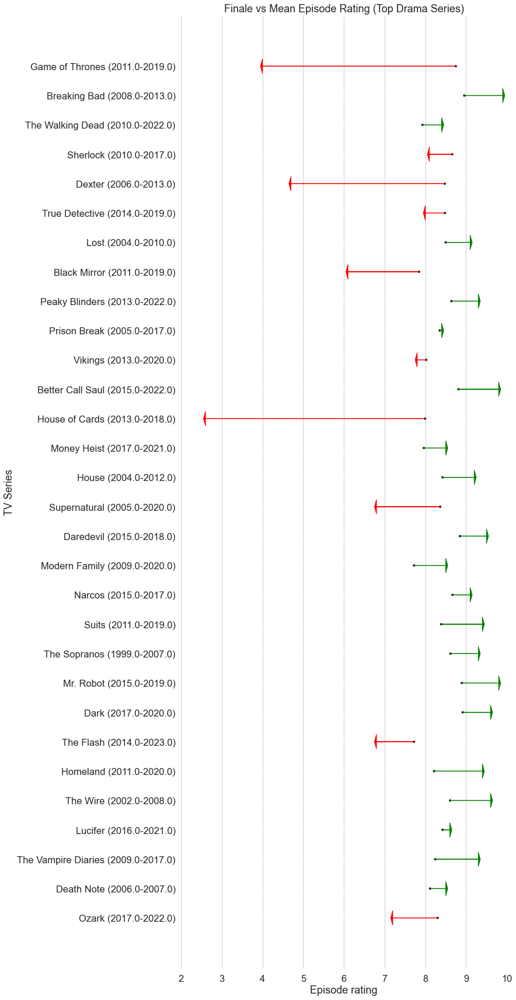

In [179]:
tvseries_episodes_ratings_popular_full=tvseries_episodes_ratings_popular_full[tvseries_episodes_ratings_popular_full.endYear.notnull()]
tvseries_episodes_ratings_popular_full= tvseries_episodes_ratings_popular_full.sort_values(by="numVotes", ascending=False) #[:30]

#initialize a plot

fig = plt.figure(figsize=(10,30))

#add start points
ax = sns.scatterplot(data=tvseries_episodes_ratings_popular_full, 
                   x='mean_averageRating', 
                   y='showTitle', 
                   size=5, 
                   color='black',
                   legend=False
                  )

#define arrows
arrow_starts = tvseries_episodes_ratings_popular_full['mean_averageRating'].values
arrow_lengths = tvseries_episodes_ratings_popular_full['finale_rating'].values - arrow_starts

#add arrows to plot
for i, subject in enumerate(tvseries_episodes_ratings_popular_full['showTitle']):
    if arrow_lengths[i] > 0.001:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.5,         #arrow head width
                 head_length=0.05,        #arrow head length
                 width=0.01,              #arrow stem width
                 fc='green',             #arrow fill color
                 ec='green')             #arrow edge color
    elif arrow_lengths[i] < -0.001:
        ax.arrow(arrow_starts[i],        #x start point
                 i,                      #y start point
                 arrow_lengths[i],       #change in x 
                 0,                      #change in y
                 head_width=0.5,         #arrow head width
                 head_length=0.05,        #arrow head length
                 width=0.01,              #arrow stem width
                 fc='red',             #arrow fill color
                 ec='red')             #arrow edge color
    else:
        continue
        

#format plot
ax.set_title('Finale vs Mean Episode Rating (Top Drama Series)')   #add title
#ax.axvline(x=7, color='black', ls='--', lw=2, zorder=0) #add line at x=0
ax.grid(axis='y', color='white')                        #add a light grid
ax.set_xlim(2,10)                                     #set x axis limits
ax.set_xlabel('Episode rating')                                #label the x axis
ax.set_ylabel('TV Series')                          #label the y axis
sns.despine(left=True, bottom=True)  

In [174]:
tvseries = df_basics[df_basics.titleType=='tvSeries']
tvseries_ratings = pd.merge(tvseries, df_ratings, on='tconst')

In [180]:
tvseries_ratings

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes
0,tt0025509,tvSeries,Les Misérables,Les misérables,0.0,1934.0,1934.0,279,Drama,8.3,1800
1,tt0035803,tvSeries,The German Weekly Review,Die Deutsche Wochenschau,0.0,1940.0,1945.0,12,"Documentary,News",8.0,53
2,tt0039120,tvSeries,Americana,Americana,0.0,1947.0,1949.0,30,"Family,Game-Show",3.3,14
3,tt0039123,tvSeries,Kraft Theatre,Kraft Television Theatre,0.0,1947.0,1958.0,60,Drama,8.2,194
4,tt0039125,tvSeries,Public Prosecutor,Public Prosecutor,0.0,1947.0,1951.0,20,"Crime,Drama,Mystery",5.6,20
...,...,...,...,...,...,...,...,...,...,...,...
83692,tt9915822,tvSeries,Ichhapyaari Naagin,Ichhapyaari Naagin,0.0,2016.0,2017.0,20,Fantasy,8.3,55
83693,tt9916128,tvSeries,Salt City (India),Salt City (India),0.0,2022.0,NaN,NaN,Drama,6.7,63
83694,tt9916206,tvSeries,Nojor,Nojor,0.0,2019.0,NaN,20,Fantasy,2.6,29
83695,tt9916216,tvSeries,Kalyanam Mudhal Kadhal Varai,Kalyanam Mudhal Kadhal Varai,0.0,2014.0,2017.0,22,Romance,9.0,7


In [181]:
tvseries_ratings_full = tvseries_ratings[tvseries_ratings.startYear.notnull()]
principals_top4 = df_principals[df_principals['ordering'] <= 4]
principals_tvseries_top4 = pd.merge(tvseries_ratings_full, principals_top4, on='tconst')


tvseries_topperson4 = principals_tvseries_top4[principals_tvseries_top4['numVotes'] >= 1000]
tvseries_topperson2 = tvseries_topperson4[tvseries_topperson4['ordering'] <= 2]
tvseries_topperson = tvseries_topperson4[tvseries_topperson4['ordering'] == 1]

tvseries_topperson_a = pd.merge(tvseries_topperson, df_episode, left_on='tconst', right_on='parentTconst')
tvseries_topperson_a = tvseries_topperson_a[(tvseries_topperson_a['seasonNumber'] != '\\N') & (tvseries_topperson_a['episodeNumber'] != '\\N')]
tvseries_topperson_a.rename(columns={"tconst_x": "tconst"}, inplace=True)
tvseries_topperson_a['seasonNumber'] = tvseries_topperson_a['seasonNumber'].astype(int)
tvseries_seasons = tvseries_topperson_a.groupby('tconst')[['seasonNumber']].max().reset_index()
tvseries_seasons2 = tvseries_seasons[tvseries_seasons['seasonNumber'] <= 82]
tvseries_episodes = tvseries_topperson_a.groupby('tconst')[['episodeNumber']].count().reset_index()
tvseries_topperson_b = pd.merge(tvseries_topperson, tvseries_seasons2, on='tconst')
tvseries_topperson = pd.merge(tvseries_topperson_b, tvseries_episodes, on='tconst')
tvseries_topperson.rename(columns={"episodeNumber": "numEpisodes"}, inplace=True)
tvseries_topperson.rename(columns={"seasonNumber": "numSeasons"}, inplace=True)

tmp1 = tvseries_topperson4[tvseries_topperson4['category'] == 'actor']
tmp2 = tvseries_topperson4[tvseries_topperson4['category'] == 'actress']
tmp11 = tmp1.groupby('tconst')[['ordering']].count().reset_index()
tmp22 = tmp2.groupby('tconst')[['ordering']].count().reset_index()
tvseries_topperson5 = pd.merge(tvseries_topperson4, tmp11, on='tconst', how='left')
tvseries_topperson6 = pd.merge(tvseries_topperson5, tmp22, on='tconst', how='left')
tvseries_topperson6['top4_actor'] = tvseries_topperson6['ordering_y'].apply(lambda x: 0 if x != x else (1 if x > 2 else 0))
tvseries_topperson6['top4_actress'] = tvseries_topperson6['ordering'].apply(lambda x: 0 if x != x else (1 if x > 2 else 0))
tvseries_topperson6['top4_other'] = 1 - tvseries_topperson6[['top4_actor', 'top4_actress']].max(axis=1)
tvseries_topperson6 = tvseries_topperson6[['tconst', 'top4_actress', 'top4_other']]
tvseries_topperson6.drop_duplicates(inplace=True)


tmp1 = tvseries_topperson2[tvseries_topperson2['category'] == 'actor']
tmp2 = tvseries_topperson2[tvseries_topperson2['category'] == 'actress']
tmp11 = tmp1.groupby('tconst')[['ordering']].count().reset_index()
tmp22 = tmp2.groupby('tconst')[['ordering']].count().reset_index()
tvseries_topperson5a = pd.merge(tvseries_topperson2, tmp11, on='tconst', how='left')
tvseries_topperson6a = pd.merge(tvseries_topperson5a, tmp22, on='tconst', how='left')
tvseries_topperson6a['top2_actor'] = tvseries_topperson6a['ordering_y'].apply(lambda x: 0 if x != x else (1 if x > 1 else 0))
tvseries_topperson6a['top2_actress'] = tvseries_topperson6a['ordering'].apply(lambda x: 0 if x != x else (1 if x > 1 else 0))
tvseries_topperson6a['top2_other'] = 1 - tvseries_topperson6a[['top2_actor', 'top2_actress']].max(axis=1)
tvseries_topperson6a = tvseries_topperson6a[['tconst', 'top2_actress', 'top2_other']]
tvseries_topperson6a.drop_duplicates(inplace=True)

tvseries_topperson_a = tvseries_topperson[tvseries_topperson.startYear.notnull()]
tvseries_topperson_b = tvseries_topperson_a.copy()
tvseries_topperson_b['startYear'] = pd.to_datetime(tvseries_topperson_a['startYear'], format='%Y')
tvseries_topperson_b['seriesYearSince2020'] = 1 + (pd.to_datetime('01/01/2020') - tvseries_topperson_b['startYear'])/ np.timedelta64(1, 'Y')
tvseries_topperson_b['seriesYearSince2020'] = 1 + (pd.to_datetime('01/01/2020') - tvseries_topperson_b['startYear'])/ np.timedelta64(1, 'Y')


one_hot2 = pd.get_dummies(tvseries_topperson_b['category'], prefix='top_ordering', drop_first=True)
tvseries_topperson_b = tvseries_topperson_b.drop('category',axis = 1)
# Join the encoded df
tvseries_topperson_b = tvseries_topperson_b.join(one_hot2)

tmp = pd.concat([pd.Series(row['tconst'], str(row['genres']).split(','))              
                    for _, row in tvseries_topperson_b.iterrows()]).reset_index()
tmp.rename(columns={"index":"genres", 0:"tconst"}, inplace=True)
tvseries_topperson_c = pd.merge(tvseries_topperson_b, tmp, on='tconst')

one_hot = pd.get_dummies(tvseries_topperson_c['genres_y'], prefix='genre')
one_hot.drop("genre_nan", axis=1, inplace=True)
# Join the encoded df
tvseries_topperson_c = tvseries_topperson_c.join(one_hot)


tvseries_topperson_d = tvseries_topperson_c.groupby('tconst').sum()[['genre_Action', 'genre_Adventure', 'genre_Animation',
       'genre_Biography', 'genre_Comedy', 'genre_Crime', 'genre_Documentary',
       'genre_Drama', 'genre_Family', 'genre_Fantasy', 'genre_Game-Show',
       'genre_History', 'genre_Horror', 'genre_Music', 'genre_Musical',
       'genre_Mystery', 'genre_News', 'genre_Reality-TV', 'genre_Romance',
       'genre_Sci-Fi', 'genre_Short', 'genre_Sport', 'genre_Talk-Show',
       'genre_Thriller', 'genre_War', 'genre_Western']]
tvseries_topperson_e = pd.merge(tvseries_topperson_b, tvseries_topperson_d, on='tconst')
tvseries_topperson_f = pd.merge(tvseries_topperson_e, tvseries_topperson6a, on='tconst')
tvseries_topperson_g = pd.merge(tvseries_topperson_f, tvseries_topperson6, on='tconst')

tvseries_topperson_g['women_show'] = (tvseries_topperson_g['top_ordering_actress']) & (tvseries_topperson_g['top2_actress'] | tvseries_topperson_g['top4_actress'])

tvseries_topperson_g['men_show'] = ((1-tvseries_topperson_g['top_ordering_actress']) & (1-tvseries_topperson_g['top_ordering_archive_footage']) &
                     (1-tvseries_topperson_g['top_ordering_self']) & (1-tvseries_topperson_g['top_ordering_writer'])) & (((1-tvseries_topperson_g['top2_actress']) & (1-tvseries_topperson_g['top2_other'])) | 
                     ((1-tvseries_topperson_g['top4_actress']) & (1-tvseries_topperson_g['top4_other'])))

tvseries_topperson_g['other_show'] = 1 - tvseries_topperson_g[['women_show', 'men_show']].max(axis=1)

tvseries_topperson_g['log_numVotes'] = np.log(tvseries_topperson_g['numVotes'])
tvseries_topperson_g['log_numEpisodes'] = np.log(tvseries_topperson_g['numEpisodes'])
tvseries_topperson_g['log_numSeasons'] = np.log(tvseries_topperson_g['numSeasons'])

tvseries_topperson_g.drop(columns=['isAdult', 'ordering'], inplace=True)


In [182]:
data_20kvotes = tvseries_topperson_g[tvseries_topperson_g['numVotes'] >= 20000][['tconst','women_show','men_show','other_show']]

tmp1 = pd.merge(data_20kvotes, tvseries_episodes_ratings_popular, left_on='tconst', right_on='id')
tmp1['showGroupInt'] = tmp1['women_show'].apply(str)+tmp1['men_show'].apply(str)+tmp1['other_show'].apply(str)
tmp1['showGroup'] = tmp1['showGroupInt'].apply(lambda x: 'More female leads' if x == '100' else ('More male leads' if x == '010' else 'Equal leads'))
tmp1.loc[tmp1.endYear == 'NaN', 'endYear'] = ''
tmp1['showTitle'] = tmp1["primaryTitle"] + " (" + tmp1["startYear"].astype(str) + "-" + tmp1["endYear"].astype(str) + ")"


In [183]:
tmp1

,tconst,women_show,men_show,other_show,id,primaryTitle,startYear,genres,titleType,isAdult,...,q3a_averageRating,rel_avgRatingDeviation_pc,rel_medDevRating_pc,seasonGroup,yearGroup,showTitle,series_episodes_rating,median_mean_rating,showGroupInt,showGroup
0,tt0098936,0,1,0,tt0098936,Twin Peaks,1990.0,"Crime,Drama,Mystery",tvSeries,0.0,...,8.9375,6.250000,17.878788,2-4,Before 2000,Twin Peaks (1990.0-1991.0),"2, 30, 8.8","8.25, 8.25",010,More male leads
1,tt0106179,0,1,0,tt0106179,The X-Files,1993.0,"Crime,Drama,Mystery",tvSeries,0.0,...,8.6000,9.302326,20.512821,5+,Before 2000,The X-Files (1993.0-2018.0),"11, 217, 8.6","7.8, 7.812",010,More male leads
2,tt0118276,0,0,1,tt0118276,Buffy the Vampire Slayer,1997.0,"Action,Drama,Fantasy",tvSeries,0.0,...,8.9000,3.614458,21.250000,5+,Before 2000,Buffy the Vampire Slayer (1997.0-2003.0),"7, 145, 8.3","8.0, 8.002",001,Equal leads
3,tt0141842,0,0,1,tt0141842,The Sopranos,1999.0,"Crime,Drama",tvSeries,0.0,...,9.2000,6.521739,12.063953,5+,Before 2000,The Sopranos (1999.0-2007.0),"6, 86, 9.2","8.6, 8.619",001,Equal leads
4,tt0165598,0,0,1,tt0165598,That '70s Show,1998.0,"Comedy,Drama,Romance",tvSeries,0.0,...,8.0000,7.407407,12.000000,5+,Before 2000,That '70s Show (1998.0-2006.0),"8, 200, 8.1","7.5, 7.513",001,Equal leads
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,tt7335184,0,0,1,tt7335184,You,2018.0,"Crime,Drama,Romance",tvSeries,0.0,...,8.6000,-3.246753,15.566038,2-4,2010-2022,You (2018.0-nan),"3, 30, 7.7","7.95, 7.963",001,Equal leads
96,tt7657124,0,1,0,tt7657124,The Heroes,2008.0,"Animation,Drama,History",tvSeries,0.0,...,8.8750,7.446809,3.160920,2-4,2000-2010,The Heroes (2008.0-nan),"3, 27, 9.4","8.7, 8.715",010,More male leads
97,tt7660850,0,1,0,tt7660850,Succession,2018.0,Drama,tvSeries,0.0,...,9.2500,1.136364,13.218391,2-4,2010-2022,Succession (2018.0-nan),"3, 29, 8.8","8.7, 8.683",010,More male leads
98,tt7767422,0,0,1,tt7767422,Sex Education,2019.0,"Comedy,Drama",tvSeries,0.0,...,8.7000,2.380952,9.756098,2-4,2010-2022,Sex Education (2019.0-nan),"3, 24, 8.4","8.2, 8.267",001,Equal leads


In [185]:
df = tmp1
df['size'] = 7

from bokeh.plotting import figure, output_file, output_notebook, show, ColumnDataSource
from bokeh.models import HoverTool, CategoricalColorMapper, Legend, LegendItem
from bokeh.transform import factor_mark, factor_cmap 
from bokeh.palettes import Magma

#output_notebook()

source = ColumnDataSource(data=df)

p = figure(plot_width=900, plot_height=600, tools=["zoom_in","zoom_out","pan","wheel_zoom"], 
           title="TV Series Rating vs Number of Votes (Top 100 Drama Series)")
#p.min_border_top = 300
#p.min_border_bottom = 100

COLOR_FACTORS = ['More male leads','Equal leads','More female leads']

scatter = p.scatter('numVotes', 'averageRating', size='size', source=source, alpha=0.5,
                  color=factor_cmap("showGroup", Magma[3], COLOR_FACTORS))

x = np.array(df['numVotes'])
y = np.array(df['averageRating'])

# fit line from linear regression above
par = np.polyfit(x, y, 1, full=True)
slope = par[0][0]
intercept = par[0][1]
y_predicted = [slope*i + intercept  for i in x]

line = p.line(x, y_predicted, color='green')

hover = HoverTool(tooltips=[
    ("Title", "@showTitle"),
    ("Seasons, Episodes, Rating", "@series_episodes_rating"),
    ("Number of votes", "@numVotes"),
    ("Genres", "@genres"),
    ("Series Type", "@showGroup")
], renderers=[scatter])

p.add_tools(hover)

# create an invisible renderer to drive color legend
rc = p.rect(x=9, y=4, height=1, width=1, color=Magma[3])
rc.visible = False

# add a color legend with explicit index, set labels to fit your need
legend = Legend(items=[
    LegendItem(label=COLOR_FACTORS[i], renderers=[rc], index=i) for i, c in enumerate(Magma[3])
], location="bottom_right")
legend.title = 'Top 4 lead actors gender group'
p.add_layout(legend)

p.title.align = 'center'
p.xaxis.axis_label = 'Total votes (Log scale)'
p.yaxis.axis_label = 'TV Series Rating'
p.background_fill_color = "white"
p.xaxis.axis_label_text_font_size = "12pt"
p.yaxis.axis_label_text_font_size = "12pt"
p.title.text_font_size = '12pt'

show(p)

In [186]:

df = tmp1
df['averageRating'] = df['averageRating'].round(3)
df['numSeasons'] = df['numSeasons'].round(1)
df['total_episodes'] = df['total_episodes'].round(1)

fig = px.box(df, x="showGroup", y="averageRating",color="showGroup",points='all',hover_name='showTitle',
             hover_data=['numSeasons','total_episodes','averageRating','genres'],
             labels={'showTitle':'Title', 'numSeasons': 'Number of Seasons', 'total_episodes': 'Number of Episodes', 
                     'averageRating': 'TV Series Rating', 'genres': 'Genres', 'showGroup': 'Lead actors gender group'},color_discrete_sequence=[
                 "blue", "purple","red"],
             title="TV Series Rating by top 4 lead actors gender group (Top 100 Drama Series)",
width=900, height=600)

fig.update_layout(title_x=0.5)
fig.show()

fig.write_html("C:/Users/maria/Desktop/Plots/TV Series Rating by top 4 lead actors gender group (Interactive plot).html")

In [187]:
fig = px.box(df, x="showGroup", y="numVotes",color="showGroup",points='all',hover_name='showTitle',
             hover_data=['numSeasons','total_episodes','averageRating','genres'],
             labels={'showTitle':'Title', 'numSeasons': 'Number of Seasons', 'total_episodes': 'Number of Episodes', 
                     'averageRating': 'TV Series Rating', 'genres': 'Genres', 'showGroup': 'Lead actors gender group'},color_discrete_sequence=[
                 "blue", "purple","red"],
             title="TV Series Number of Votes by top 4 lead actors gender group (Top 100 Drama Series)",
width=900, height=600)

fig.update_layout(title_x=0.5)
fig.show()

fig.write_html("C:/Users/maria/Desktop/Plots/TV Series Number of Votes by top 4 lead actors gender group (Interactive plot).html")

In [ ]:
#women are way more likely to watch male dominant series than men watching female dominant series

#pus purple em equal leads pq blue com red dá purple
#pode ser blue green and yellow também